In [19]:
import os
import datetime as dt
from datetime import date
import numpy as np
import pandas as pd
from os import listdir
from os.path import isfile, join
from pprint import pprint
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor, VotingClassifier, VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import svm
from sklearn import linear_model
from tqdm import tqdm
from scipy.stats import norm
import statistics
from ast import literal_eval
from dateutil.relativedelta import relativedelta
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
import copy

pd.set_option('max_columns', 330)
pd.set_option('max_rows', 1000)

In [2]:
%matplotlib inline
# plt.style.use('ggplot')

# Load dataframes

In [8]:
input_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Ner thesis\\'
df = pd.read_excel(input_path+'data.xlsx', index_col=0)
df['month'] = df.index.month  # taking account of seasonality
df

,Aluminium (USD/tonne),Copper (USD/pound),Zinc (USD/tonne),Nickel (USD/MT),Lead (USD/tonne),Tin (USD/tonne),Silver (USD/ t oz),Gold (USD/ t oz),Crude Oil WTI (USD/ bbl),Crude oil Brent (USD/bbl),Natural gas (USD/Mmbtu),USD index,DJIA (USD),FTSE 100 (GBP),Hang seng (HKD),US libor,month
Date,,,,,,,,,,,,,,,,,
1995-01-03,2007.00,1.3560,1142.80,8900.0,657.00,6032.0,4.721,379.6,17.4400,16.0900,1.6830,89.110,3838.47,3065.70,7844.14,6.5000,1
1995-01-04,1970.80,1.3420,1125.80,8786.0,649.00,5962.0,4.595,374.0,17.4800,16.1900,1.6170,89.310,3857.65,3051.60,7887.01,6.5000,1
1995-01-05,2005.80,1.3590,1138.00,9093.0,649.80,6009.0,4.694,375.4,17.7200,16.4600,1.5520,88.980,3850.92,3032.30,7918.38,6.4400,1
1995-01-06,2022.00,1.3740,1140.00,9262.0,659.00,6025.0,4.616,371.2,17.6700,16.5000,1.4990,89.610,3867.41,3065.00,7683.25,6.4400,1
1995-01-09,2033.50,1.4090,1149.30,9151.0,663.80,6059.0,4.655,373.1,17.4000,16.2800,1.4540,88.410,3861.35,3055.80,7528.88,6.3800,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,1786.25,2.8530,2284.50,14281.0,1901.00,17275.0,17.463,1484.3,60.4154,65.4767,2.1828,97.658,28551.53,7623.59,27906.41,1.9466,12
2019-12-24,1818.00,2.8730,2274.75,14270.0,1934.50,17195.0,17.821,1500.6,61.0619,66.0053,2.1456,97.654,28515.45,7632.24,27864.21,1.9605,12
2019-12-27,1822.50,2.8765,2312.00,14136.5,1926.25,17070.0,17.900,1514.3,61.4917,66.8472,2.1940,96.919,28645.26,7644.90,28225.42,1.9446,12


### create lagged df

In [9]:
def lagged_df_func(df, target_variable, min_lag=1, max_lag=90):
    '''Create a dataframe with variables that are lagged between a minimum and maximum lag
    Arg1: datafarme produced as output of exploratory data analysis functions
    Arg2: variable for the analysis
    Arg2: minimum lag for each variable
    Arg3: Maximum lag for each variable
    Returns: Pandas dataframe with variables lagged between minimum and maximum lag
    '''
    df = df.reset_index()  # .drop(columns='index')
    feature_list = list(df.columns)
    feature_list.remove('month')
    feature_list.remove('Date')

    lagged_df = pd.DataFrame()

    for variable in feature_list:
        for i in range(min_lag, max_lag + 1):
            col2 = df[variable].shift(i)
            lagged_df[variable + '_' + str(i)] = col2

    lagged_df['Date'] = df['Date']
    lagged_df['month'] = df['month']
    lagged_df[target_variable] = df[target_variable]
    if target_variable+'_0' in lagged_df.columns:
        lagged_df = lagged_df.drop(columns=['malaria_prev_0'])
    lagged_df.set_index('Date', inplace=True)
    
    return(lagged_df)

# 1. Univariate analysis

First define functions

In [44]:
results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Ner thesis\results\\'

def plot_model_performance(lagged_df, results, y_test, target_var, results_path):
    plt.figure(figsize=(20, 20))

    plt.plot(lagged_df.index[results['lead_time']:results['test_break']+results['lead_time']],
             lagged_df[target_var][results['lead_time']:results['test_break']+results['lead_time']], 'b')
    plt.plot(results['predicted dates'], y_test, 'b', label='observed')
    plt.plot(results['predicted dates'], results['central_prediction'], 'y', label='central prediction')
#     plt.plot(results['predicted dates'], results['upper_bound'], 'r', label='upper prediction')
#     plt.plot(results['predicted dates'], results['lower_bound'], 'r', label='lower prediction')
    conf = results['confidence_interval']
#     plt.fill_between(results['predicted dates'], results['lower_bound'], results['upper_bound'],
#                      color='r', alpha=0.05, label=f'{conf:.0f}% confidence interval')
    plt.legend()
    plt.xlabel('dates')
    plt.ylabel(target_var)
    mt = results['model_type']
    lt = results['lead_time']
    title = f'Model {mt} with lead time {lt} and confidence interval {conf:.0f}% performance'
    plt.title(title)
    plt.grid()
    plt.savefig(results_path+title)
    plt.show();

def zoomed_model_performance(results, y_test, target_var, results_path):
    # plot
    plt.figure(figsize=(12, 12))

    plt.plot(results['predicted dates'], y_test, 'b', label='observed')
    plt.plot(results['predicted dates'], results['central_prediction'], 'y', label='central prediction')
    plt.plot(results['predicted dates'], results['upper_bound'], 'r', label='upper prediction')
    plt.plot(results['predicted dates'], results['lower_bound'], 'r', label='lower prediction')
    conf = results['confidence_interval']
    plt.fill_between(results['predicted dates'], results['lower_bound'], results['upper_bound'],
                     color='r', alpha=0.05, label=f'{conf:.0f}% confidence interval')

    plt.legend()
    plt.xlabel('dates')
    plt.ylabel(target_var)
    mt = results['model_type']
    lt = results['lead_time']
    title = f'Zoomed in - Model {mt} with lead time {lt} and confidence interval {conf:.0f}% performance'
    plt.title(title)
    plt.grid()
    plt.savefig(results_path + title)
    plt.show();

def model_run(lagged_df, model_type, best_vars, lead_time, target_var, confidence=0.9, boot=1000, test_ratio=0.1):
    model_dict = {'MLPRegressor()': MLPRegressor(), 'XGBRegressor()': XGBRegressor(),
                  'RandomForestRegressor()': RandomForestRegressor(),
                  'LinearRegression()': linear_model.LinearRegression(), 'Ridge()': linear_model.Ridge(),
                  'SVR()': svm.SVR(), 'KNeighborsRegressor()': KNeighborsRegressor()}

    model_df = lagged_df.copy()
    mod = model_dict[model_type]
    lagged_df = lagged_df[best_vars]  # get rid of not usefull variables

    # create test dataset, if we want to test on the last values
    # if random_test == False:
    test_break = int(len(lagged_df) * (1 - test_ratio))
    X_train = lagged_df.drop(columns=target_var).to_numpy()[:test_break]
    y_train = lagged_df[target_var].to_numpy()[lead_time-1:test_break + lead_time-1]
    if lead_time > 1:  # :0 returns nothing
        X_test = lagged_df.drop(columns=target_var).to_numpy()[test_break:-lead_time+1]
    else:
        X_test = lagged_df.drop(columns=target_var).to_numpy()[test_break:]
    y_test = lagged_df[target_var].to_numpy()[test_break + lead_time - 1:]
    pred_date = lagged_df.index[test_break + lead_time - 1:]  # lead time already added  + pd.DateOffset(months=lead_time)
    pred_date = pred_date.to_numpy()

    # else:  # Alternatively, for random testing
    #     X_train, X_test, y_train, y_test = train_test_split(lagged_df.drop(columns=target_var).to_numpy(),
    #                                                         lagged_df[target_var].to_numpy(),
    #                                                         test_size=test_ratio,
    #                                                         #                                                         random_state=42
    #                                                         )

    # train model
    scalar = StandardScaler()
    scalar.fit_transform(X_train)
    #     print(np.shape(X_train), np.shape(X_test))
    scalar.transform(X_test)

    eval_set = [(X_test, y_test)]
    mod.fit(X_train, y_train)  # , eval_metric="rmse", eval_set=eval_set, verbose=False)

    # make predictions for test data
    predictions = -9999 * np.ones((boot, len(y_test)))
    temp_lagged_df = lagged_df[:test_break]  # training values to be used for bootstrapping

    for j in range(boot):
        bootstrap_df = lagged_df.sample(int(len(temp_lagged_df) * 0.8), replace=True)

        bs_X_train = bootstrap_df.drop(columns=target_var)
        bs_y_train = bootstrap_df[target_var]

        scalar = StandardScaler()
        scalar.fit_transform(bs_X_train)

        mod.fit(bs_X_train, bs_y_train)

#         scalar.transform(X_test)
        y_pred = mod.predict(X_test)
        #             predictions.append(y_pred)
        predictions[j, :] = y_pred

    upper = -9999 * np.ones(len(y_test))
    mean = -9999 * np.ones(len(y_test))
    lower = -9999 * np.ones(len(y_test))

    for j in range(len(y_test)):
        pred = predictions[:, j]
        pred = np.sort(pred)

        lower[j] = pred[int(len(pred) * ((1 - confidence) / 2))]
        mean[j] = pred[int(len(pred) * 0.5)]
        upper[j] = pred[int(len(pred) * (1 - ((1 - confidence) / 2)))]


    # log to raw
#     predictions = np.exp(predictions)
#     y_test = np.exp(y_test)
#     lower = np.exp(lower)
#     mean = np.exp(mean)
#     upper = np.exp(upper)
    
    # evaluate predictions
    rmse = np.sqrt(mean_squared_error(y_test, mean))
    coefficient_of_dermination = r2_score(y_test, mean)
    emse = np.mean(y_test**2 - mean**2)
    mae = np.mean(y_test - mean)
    mape = np.mean(np.abs((y_test - mean)/y_test))*100  # %
    nse = 1-(np.sum((mean-y_test)**2)/np.sum((y_test-np.mean(y_test))**2))

    results_dict = {'model_type': model_type, 'lead_time': int(lead_time), 'root mean squared error': rmse,
                    'MAE':mae, 'MAPE [%]':mape, 'R2:': coefficient_of_dermination, 'expected mean squared error': emse, 
                    'NSE':nse, 'test_break': test_break, 'confidence_interval': confidence * 100, 
                    'predicted dates': pred_date, 'lower_bound': lower, 'central_prediction': mean, 'upper_bound': upper,
                    'test_ratio': test_ratio * 100}

    return(results_dict, predictions, y_test)

### 1. target variable is 'Aluminium (USD/tonne)'

ML models

In [ ]:
target_var = 'Aluminium (USD/tonne)'

In [46]:
lagged_df = lagged_df_func(df, target_var, min_lag=1, max_lag=50)
lagged_df.dropna(inplace=True)
lagged_df

C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df[variable + '_' + str(i)] = col2
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df['Date'] = df['Date']
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfor

,Aluminium (USD/tonne)_1,Aluminium (USD/tonne)_2,Aluminium (USD/tonne)_3,Aluminium (USD/tonne)_4,Aluminium (USD/tonne)_5,Aluminium (USD/tonne)_6,Aluminium (USD/tonne)_7,Aluminium (USD/tonne)_8,Aluminium (USD/tonne)_9,Aluminium (USD/tonne)_10,Aluminium (USD/tonne)_11,Aluminium (USD/tonne)_12,Aluminium (USD/tonne)_13,Aluminium (USD/tonne)_14,Aluminium (USD/tonne)_15,Aluminium (USD/tonne)_16,Aluminium (USD/tonne)_17,Aluminium (USD/tonne)_18,Aluminium (USD/tonne)_19,Aluminium (USD/tonne)_20,Aluminium (USD/tonne)_21,Aluminium (USD/tonne)_22,Aluminium (USD/tonne)_23,Aluminium (USD/tonne)_24,Aluminium (USD/tonne)_25,Aluminium (USD/tonne)_26,Aluminium (USD/tonne)_27,Aluminium (USD/tonne)_28,Aluminium (USD/tonne)_29,Aluminium (USD/tonne)_30,Aluminium (USD/tonne)_31,Aluminium (USD/tonne)_32,Aluminium (USD/tonne)_33,Aluminium (USD/tonne)_34,Aluminium (USD/tonne)_35,Aluminium (USD/tonne)_36,Aluminium (USD/tonne)_37,Aluminium (USD/tonne)_38,Aluminium (USD/tonne)_39,Aluminium (USD/tonne)_40,Aluminium (USD/tonne)_41,Aluminium (USD/tonne)_42,Aluminium (USD/tonne)_43,Aluminium (USD/tonne)_44,Aluminium (USD/tonne)_45,Aluminium (USD/tonne)_46,Aluminium (USD/tonne)_47,Aluminium (USD/tonne)_48,Aluminium (USD/tonne)_49,Aluminium (USD/tonne)_50,Copper (USD/pound)_1,Copper (USD/pound)_2,Copper (USD/pound)_3,Copper (USD/pound)_4,Copper (USD/pound)_5,Copper (USD/pound)_6,Copper (USD/pound)_7,Copper (USD/pound)_8,Copper (USD/pound)_9,Copper (USD/pound)_10,Copper (USD/pound)_11,Copper (USD/pound)_12,Copper (USD/pound)_13,Copper (USD/pound)_14,Copper (USD/pound)_15,Copper (USD/pound)_16,Copper (USD/pound)_17,Copper (USD/pound)_18,Copper (USD/pound)_19,Copper (USD/pound)_20,Copper (USD/pound)_21,Copper (USD/pound)_22,Copper (USD/pound)_23,Copper (USD/pound)_24,Copper (USD/pound)_25,Copper (USD/pound)_26,Copper (USD/pound)_27,Copper (USD/pound)_28,Copper (USD/pound)_29,Copper (USD/pound)_30,Copper (USD/pound)_31,Copper (USD/pound)_32,Copper (USD/pound)_33,Copper (USD/pound)_34,Copper (USD/pound)_35,Copper (USD/pound)_36,Copper (USD/pound)_37,Copper (USD/pound)_38,Copper (USD/pound)_39,Copper (USD/pound)_40,Copper (USD/pound)_41,Copper (USD/pound)_42,Copper (USD/pound)_43,Copper (USD/pound)_44,Copper (USD/pound)_45,Copper (USD/pound)_46,Copper (USD/pound)_47,Copper (USD/pound)_48,Copper (USD/pound)_49,Copper (USD/pound)_50,Zinc (USD/tonne)_1,Zinc (USD/tonne)_2,Zinc (USD/tonne)_3,Zinc (USD/tonne)_4,Zinc (USD/tonne)_5,Zinc (USD/tonne)_6,Zinc (USD/tonne)_7,Zinc (USD/tonne)_8,Zinc (USD/tonne)_9,Zinc (USD/tonne)_10,Zinc (USD/tonne)_11,Zinc (USD/tonne)_12,Zinc (USD/tonne)_13,Zinc (USD/tonne)_14,Zinc (USD/tonne)_15,Zinc (USD/tonne)_16,Zinc (USD/tonne)_17,Zinc (USD/tonne)_18,Zinc (USD/tonne)_19,Zinc (USD/tonne)_20,Zinc (USD/tonne)_21,Zinc (USD/tonne)_22,Zinc (USD/tonne)_23,Zinc (USD/tonne)_24,Zinc (USD/tonne)_25,Zinc (USD/tonne)_26,Zinc (USD/tonne)_27,Zinc (USD/tonne)_28,Zinc (USD/tonne)_29,Zinc (USD/tonne)_30,Zinc (USD/tonne)_31,Zinc (USD/tonne)_32,Zinc (USD/tonne)_33,Zinc (USD/tonne)_34,Zinc (USD/tonne)_35,Zinc (USD/tonne)_36,Zinc (USD/tonne)_37,Zinc (USD/tonne)_38,Zinc (USD/tonne)_39,Zinc (USD/tonne)_40,Zinc (USD/tonne)_41,Zinc (USD/tonne)_42,Zinc (USD/tonne)_43,Zinc (USD/tonne)_44,Zinc (USD/tonne)_45,Zinc (USD/tonne)_46,Zinc (USD/tonne)_47,Zinc (USD/tonne)_48,Zinc (USD/tonne)_49,Zinc (USD/tonne)_50,Nickel (USD/MT)_1,Nickel (USD/MT)_2,Nickel (USD/MT)_3,Nickel (USD/MT)_4,Nickel (USD/MT)_5,Nickel (USD/MT)_6,Nickel (USD/MT)_7,Nickel (USD/MT)_8,Nickel (USD/MT)_9,Nickel (USD/MT)_10,Nickel (USD/MT)_11,Nickel (USD/MT)_12,Nickel (USD/MT)_13,Nickel (USD/MT)_14,Nickel (USD/MT)_15,...,DJIA (USD)_38,DJIA (USD)_39,DJIA (USD)_40,DJIA (USD)_41,DJIA (USD)_42,DJIA (USD)_43,DJIA (USD)_44,DJIA (USD)_45,DJIA (USD)_46,DJIA (USD)_47,DJIA (USD)_48,DJIA (USD)_49,DJIA (USD)_50,FTSE 100 (GBP)_1,FTSE 100 (GBP)_2,FTSE 100 (GBP)_3,FTSE 100 (GBP)_4,FTSE 100 (GBP)_5,FTSE 100 (GBP)_6,FTSE 100 (GBP)_7,FTSE 100 (GBP)_8,FTSE 100 (GBP)_9,FTSE 100 (GBP)_10,FTSE 100 (GBP)_11,FTSE 100 (GBP)_12,FTSE 10

In [47]:
results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results\performance plots//'
excel_results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results//'

model_types = ['XGBRegressor()', 'RandomForestRegressor()', 'LinearRegression()', 
               'Ridge()', 'SVR()', 'KNeighborsRegressor()', 'MLPRegressor()']

lead_times = [1, 2, 3, 4, 5, 6]

confidence_intervals = [0.8, 0.9, 0.95]
# confidence_intervals = [0.95]

best_vars = [ x for x in lagged_df.columns if target_var in x ]  # keep best vars univariate
best_vars

['Aluminium (USD/tonne)_1',
 'Aluminium (USD/tonne)_2',
 'Aluminium (USD/tonne)_3',
 'Aluminium (USD/tonne)_4',
 'Aluminium (USD/tonne)_5',
 'Aluminium (USD/tonne)_6',
 'Aluminium (USD/tonne)_7',
 'Aluminium (USD/tonne)_8',
 'Aluminium (USD/tonne)_9',
 'Aluminium (USD/tonne)_10',
 'Aluminium (USD/tonne)_11',
 'Aluminium (USD/tonne)_12',
 'Aluminium (USD/tonne)_13',
 'Aluminium (USD/tonne)_14',
 'Aluminium (USD/tonne)_15',
 'Aluminium (USD/tonne)_16',
 'Aluminium (USD/tonne)_17',
 'Aluminium (USD/tonne)_18',
 'Aluminium (USD/tonne)_19',
 'Aluminium (USD/tonne)_20',
 'Aluminium (USD/tonne)_21',
 'Aluminium (USD/tonne)_22',
 'Aluminium (USD/tonne)_23',
 'Aluminium (USD/tonne)_24',
 'Aluminium (USD/tonne)_25',
 'Aluminium (USD/tonne)_26',
 'Aluminium (USD/tonne)_27',
 'Aluminium (USD/tonne)_28',
 'Aluminium (USD/tonne)_29',
 'Aluminium (USD/tonne)_30',
 'Aluminium (USD/tonne)_31',
 'Aluminium (USD/tonne)_32',
 'Aluminium (USD/tonne)_33',
 'Aluminium (USD/tonne)_34',
 'Aluminium (USD/tonne)

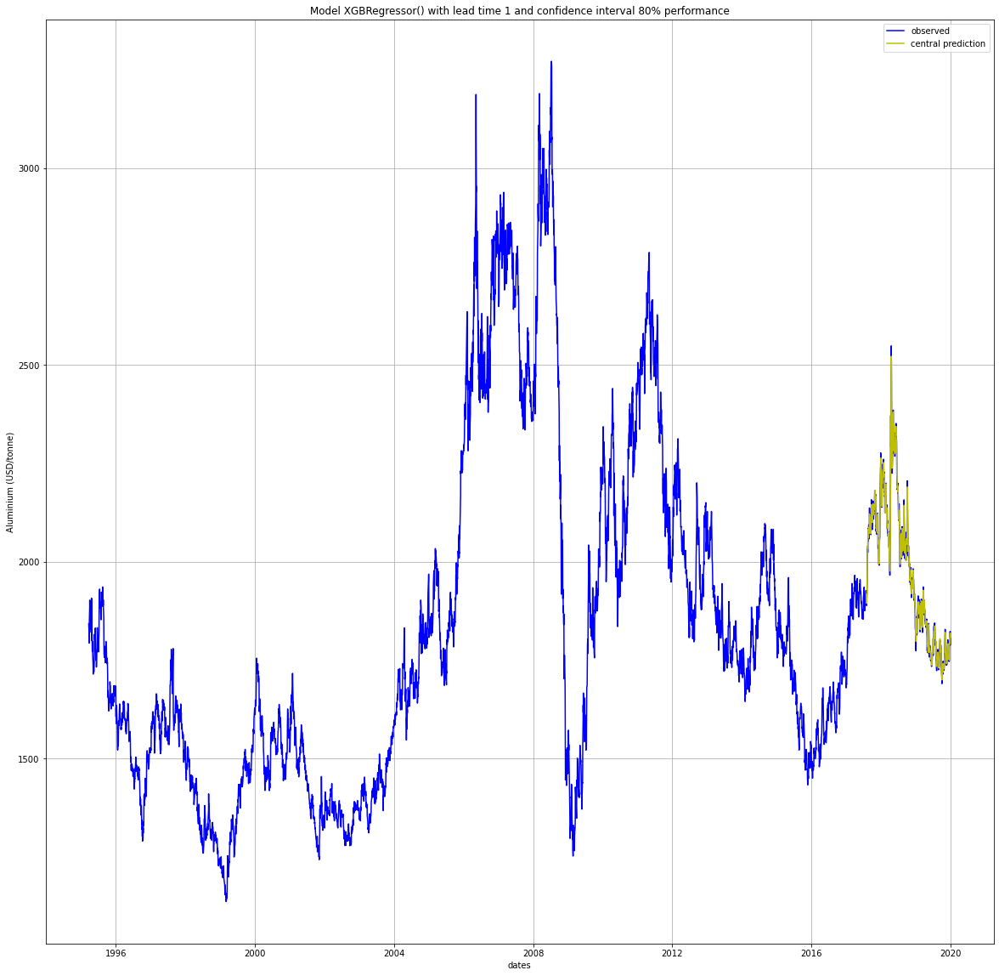

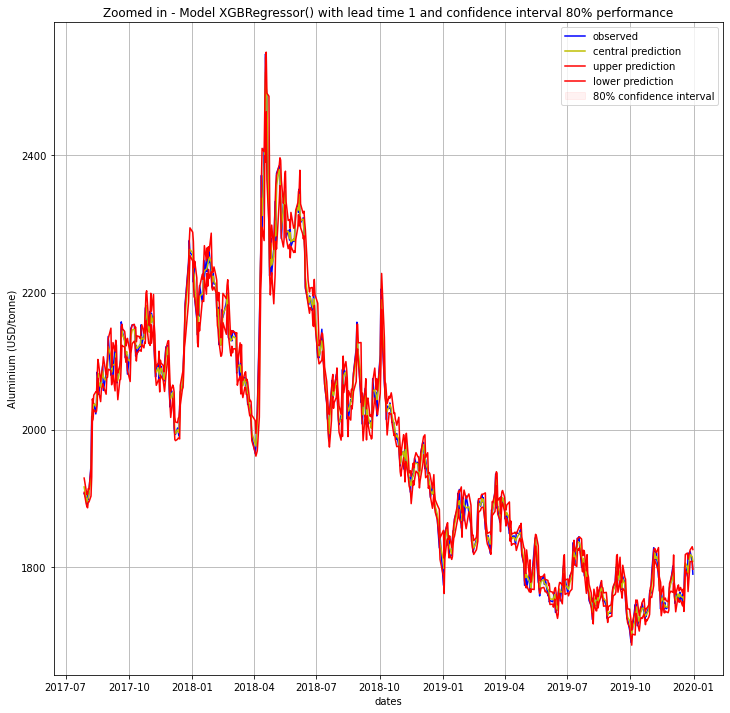

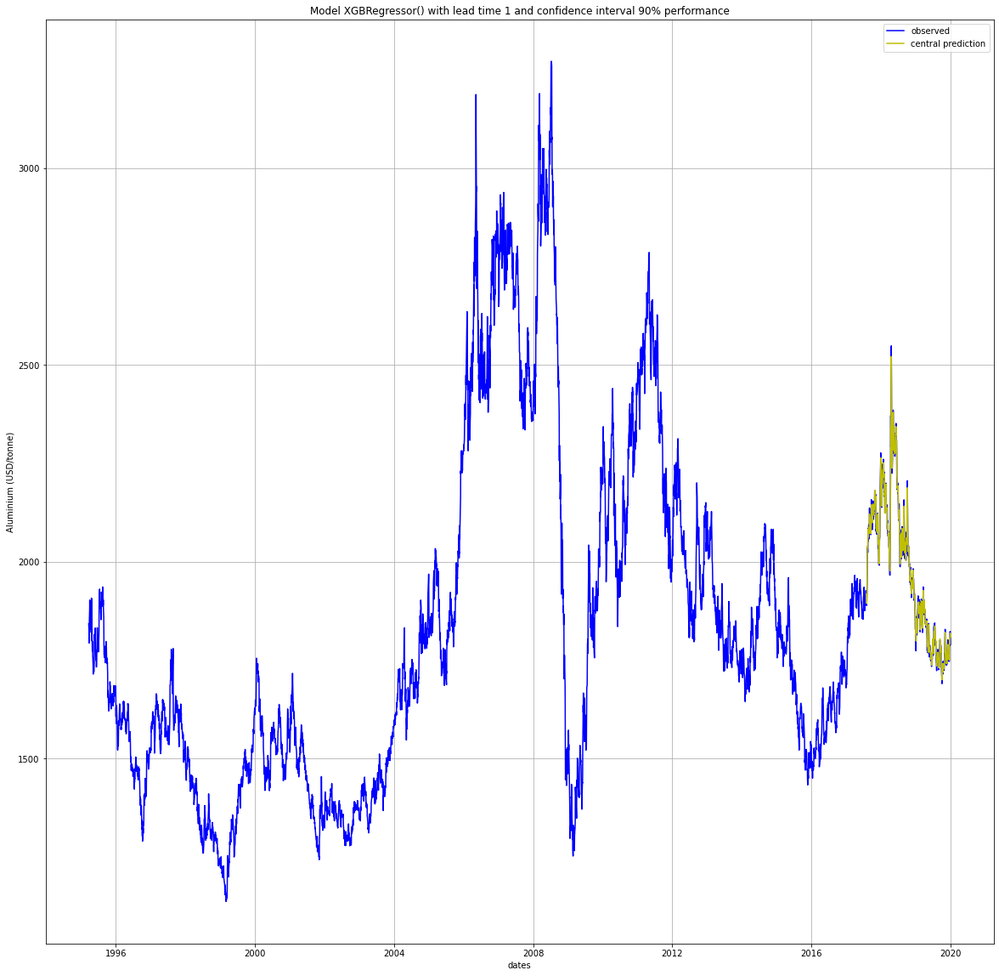

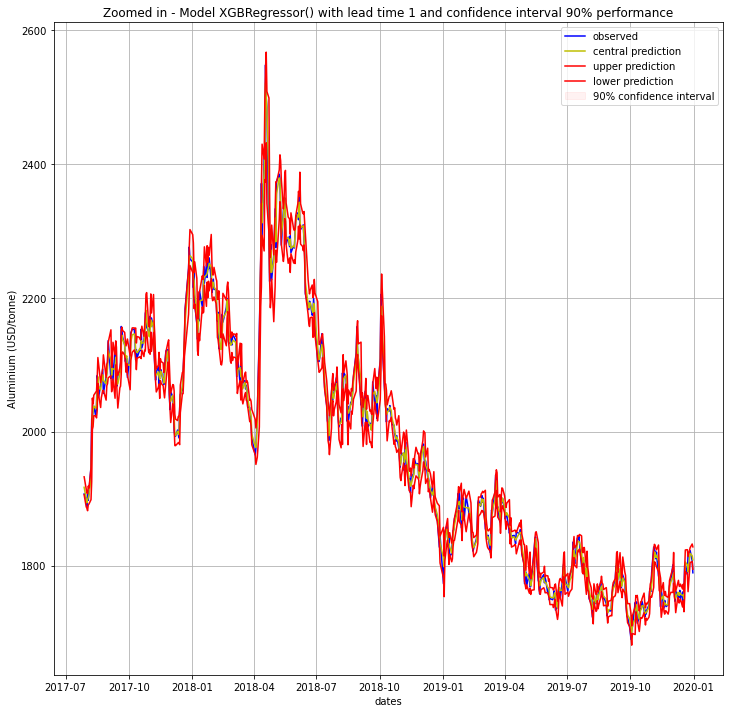

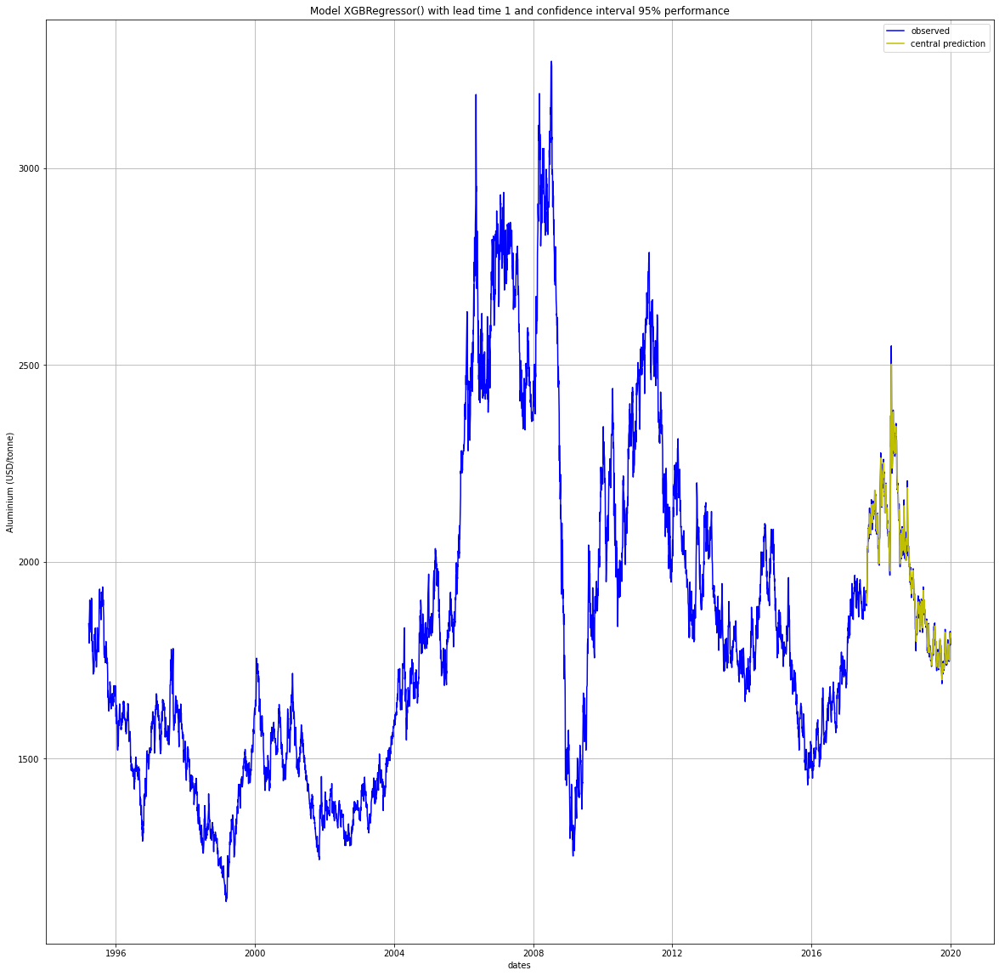

...

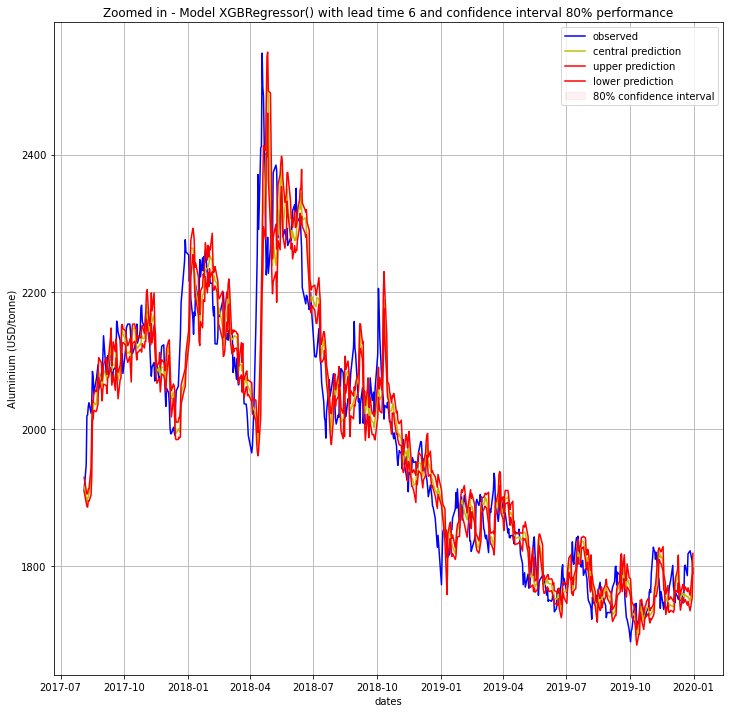

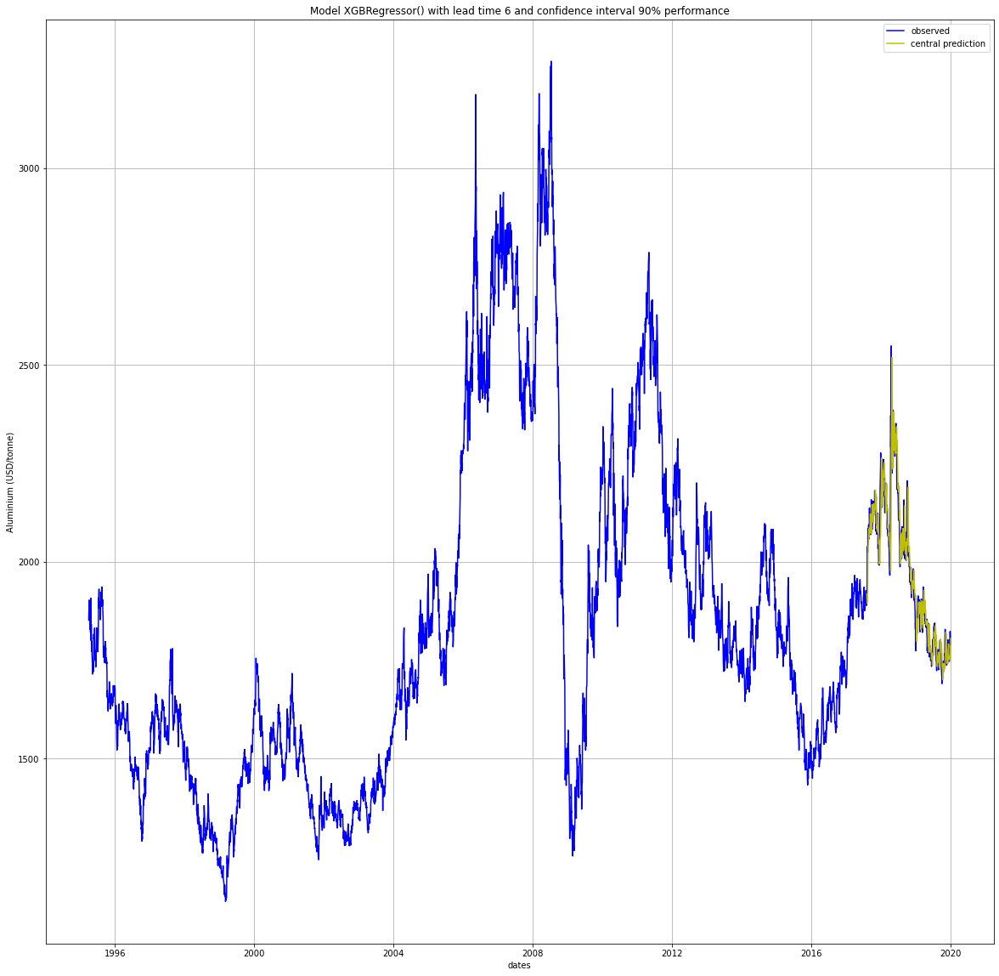

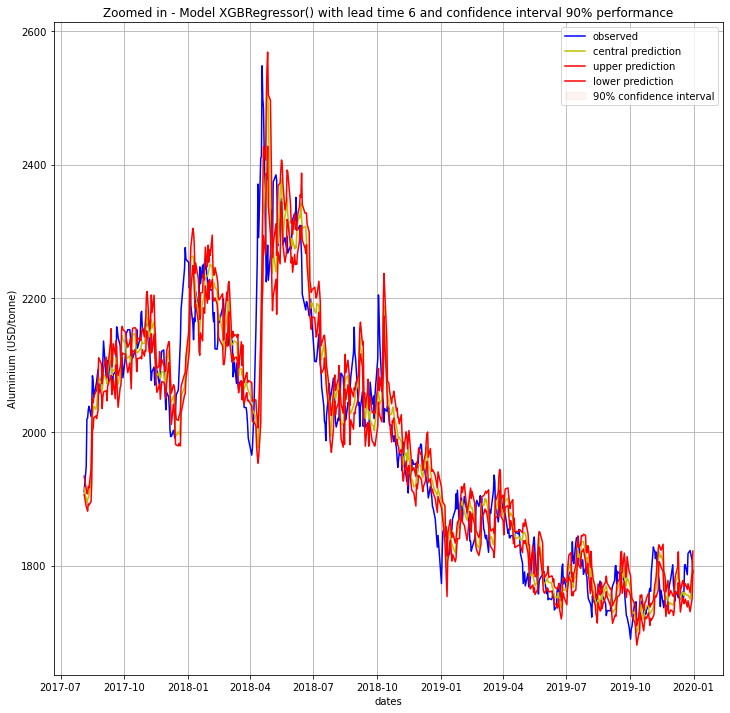

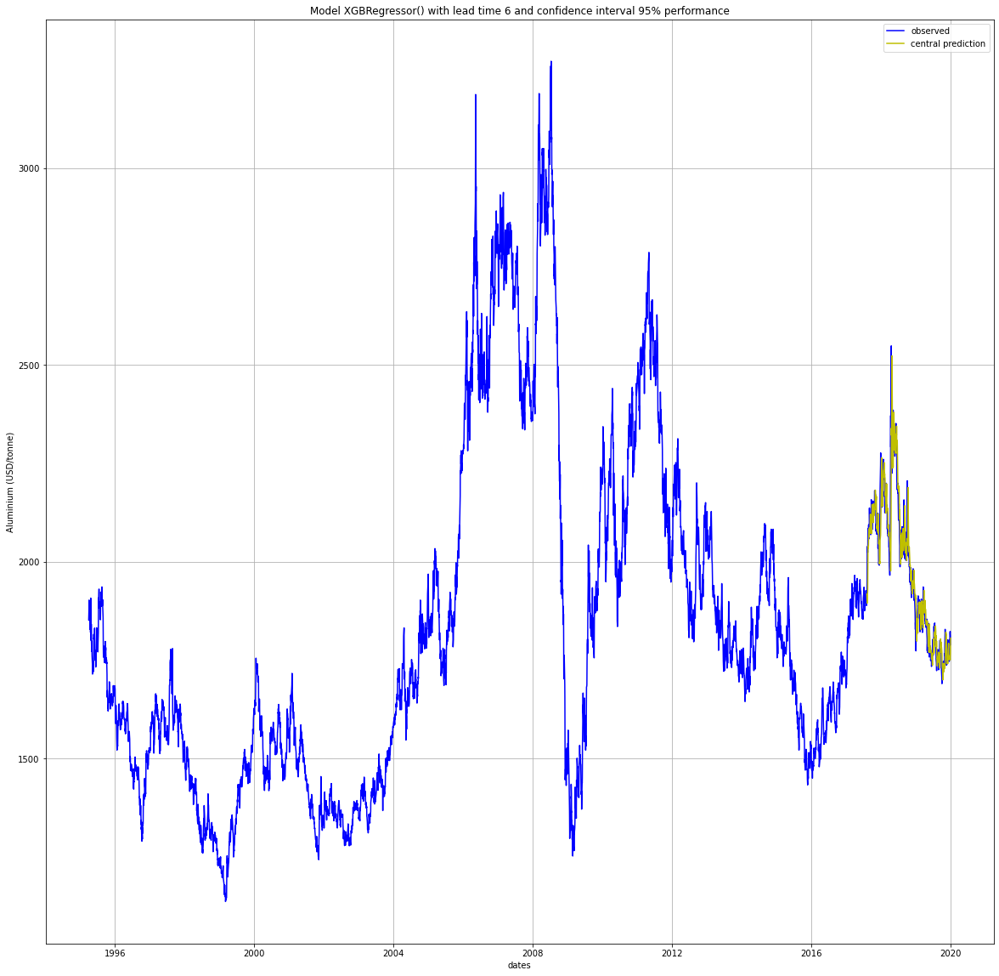

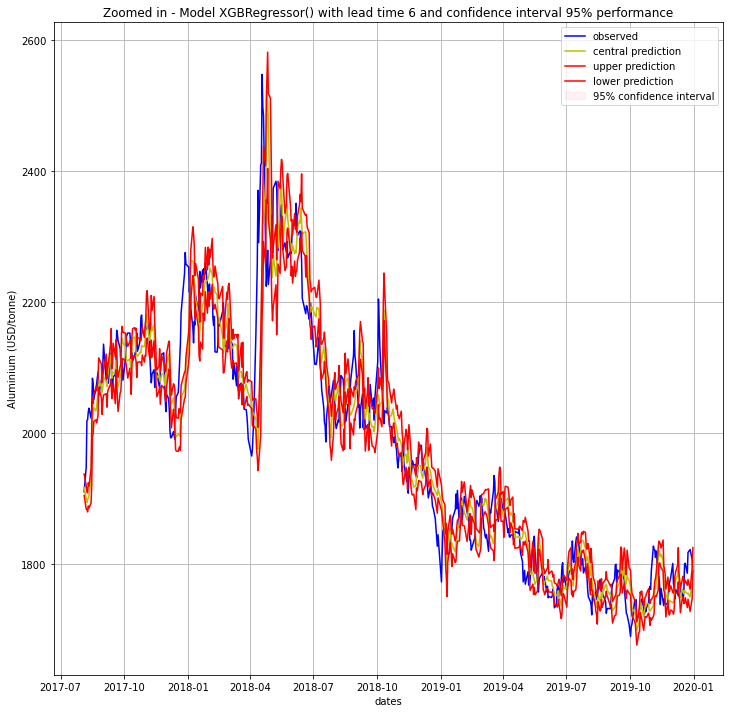

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

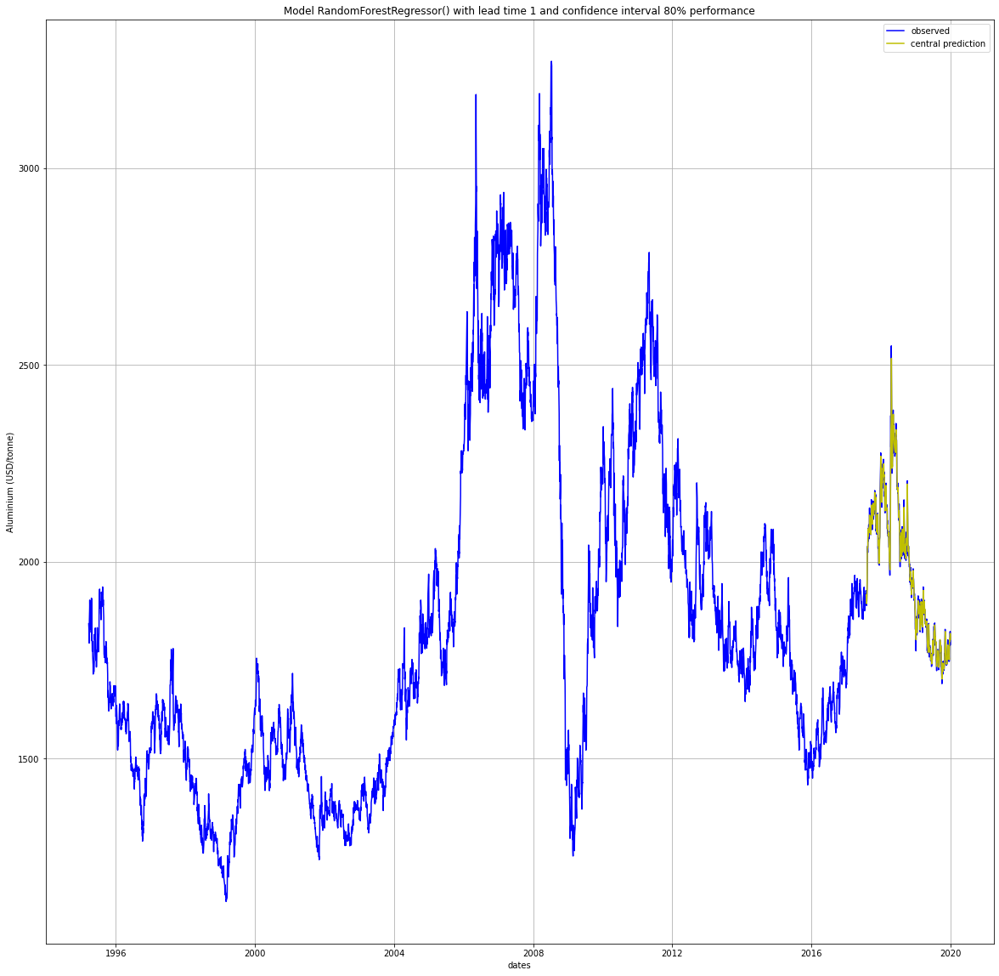

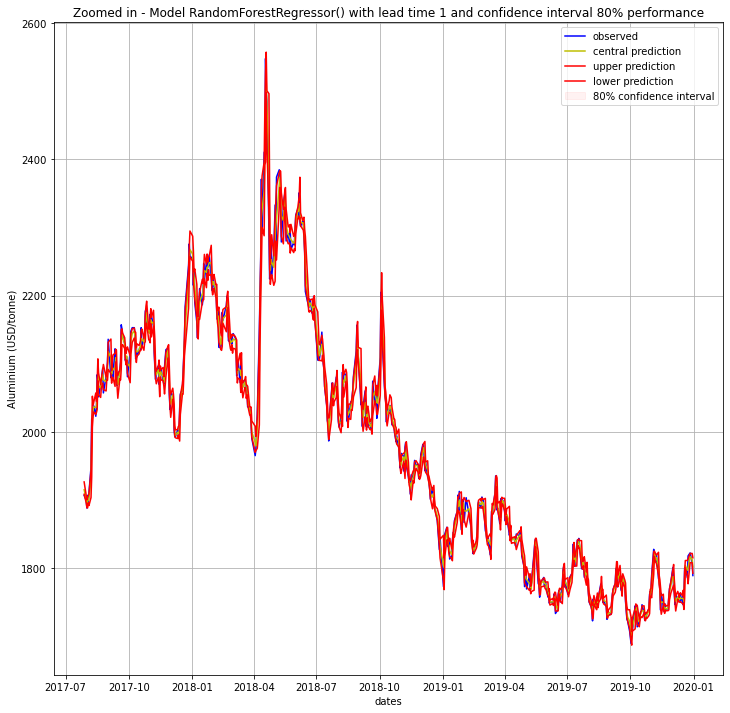

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

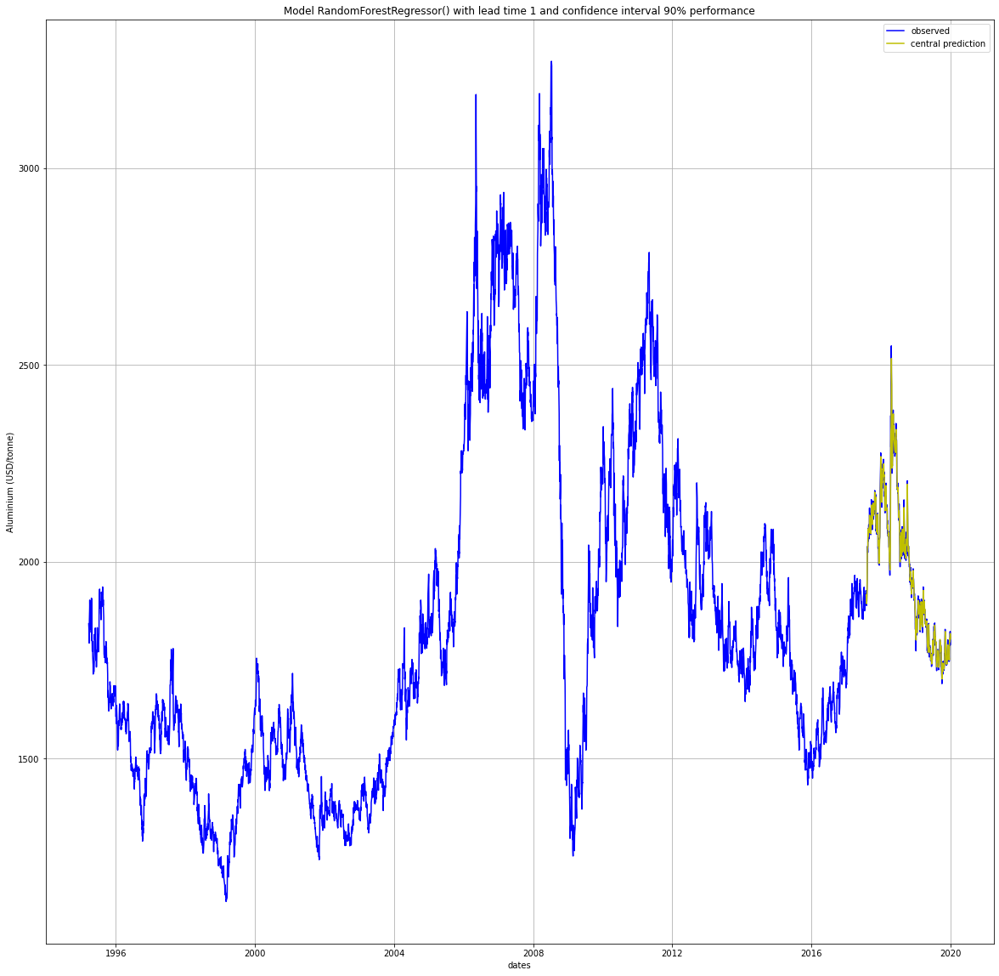

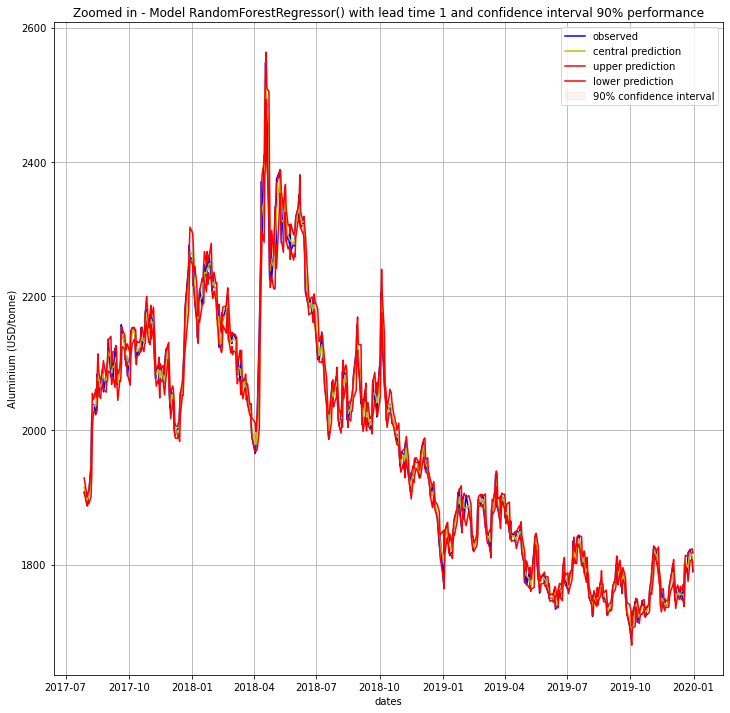

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

KeyboardInterrupt: 

In [48]:
predictions_df = pd.DataFrame()

for model_type in model_types:
    for lead_time in lead_times:
        for confidence_interval in confidence_intervals:

            results, predictions, y_test = model_run(lagged_df=lagged_df, 
                                                     model_type=model_type, 
                                                     best_vars=best_vars, 
                                                     lead_time=lead_time, 
                                                     target_var=target_var,
                                                     confidence=confidence_interval,
                                                     boot=1000, 
                                                     test_ratio=0.1
                                                    )
            # plot results
#             print(results)
            plot_model_performance(lagged_df, results, y_test, target_var, results_path)
            zoomed_model_performance(results, y_test, target_var, results_path)
            
            predictions_df = predictions_df.append(results, ignore_index=True)
        
predictions_df.to_excel(excel_results_path+'ML Model results - daily resolution.xlsx', index=False)
predictions_df

### 2. target variable is 'Copper (USD/pound)'

ML models

In [ ]:
target_var = 'Copper (USD/pound)'

In [46]:
lagged_df = lagged_df_func(df, target_var, min_lag=1, max_lag=50)
lagged_df.dropna(inplace=True)
lagged_df

C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df[variable + '_' + str(i)] = col2
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df['Date'] = df['Date']
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfor

,Aluminium (USD/tonne)_1,Aluminium (USD/tonne)_2,Aluminium (USD/tonne)_3,Aluminium (USD/tonne)_4,Aluminium (USD/tonne)_5,Aluminium (USD/tonne)_6,Aluminium (USD/tonne)_7,Aluminium (USD/tonne)_8,Aluminium (USD/tonne)_9,Aluminium (USD/tonne)_10,Aluminium (USD/tonne)_11,Aluminium (USD/tonne)_12,Aluminium (USD/tonne)_13,Aluminium (USD/tonne)_14,Aluminium (USD/tonne)_15,Aluminium (USD/tonne)_16,Aluminium (USD/tonne)_17,Aluminium (USD/tonne)_18,Aluminium (USD/tonne)_19,Aluminium (USD/tonne)_20,Aluminium (USD/tonne)_21,Aluminium (USD/tonne)_22,Aluminium (USD/tonne)_23,Aluminium (USD/tonne)_24,Aluminium (USD/tonne)_25,Aluminium (USD/tonne)_26,Aluminium (USD/tonne)_27,Aluminium (USD/tonne)_28,Aluminium (USD/tonne)_29,Aluminium (USD/tonne)_30,Aluminium (USD/tonne)_31,Aluminium (USD/tonne)_32,Aluminium (USD/tonne)_33,Aluminium (USD/tonne)_34,Aluminium (USD/tonne)_35,Aluminium (USD/tonne)_36,Aluminium (USD/tonne)_37,Aluminium (USD/tonne)_38,Aluminium (USD/tonne)_39,Aluminium (USD/tonne)_40,Aluminium (USD/tonne)_41,Aluminium (USD/tonne)_42,Aluminium (USD/tonne)_43,Aluminium (USD/tonne)_44,Aluminium (USD/tonne)_45,Aluminium (USD/tonne)_46,Aluminium (USD/tonne)_47,Aluminium (USD/tonne)_48,Aluminium (USD/tonne)_49,Aluminium (USD/tonne)_50,Copper (USD/pound)_1,Copper (USD/pound)_2,Copper (USD/pound)_3,Copper (USD/pound)_4,Copper (USD/pound)_5,Copper (USD/pound)_6,Copper (USD/pound)_7,Copper (USD/pound)_8,Copper (USD/pound)_9,Copper (USD/pound)_10,Copper (USD/pound)_11,Copper (USD/pound)_12,Copper (USD/pound)_13,Copper (USD/pound)_14,Copper (USD/pound)_15,Copper (USD/pound)_16,Copper (USD/pound)_17,Copper (USD/pound)_18,Copper (USD/pound)_19,Copper (USD/pound)_20,Copper (USD/pound)_21,Copper (USD/pound)_22,Copper (USD/pound)_23,Copper (USD/pound)_24,Copper (USD/pound)_25,Copper (USD/pound)_26,Copper (USD/pound)_27,Copper (USD/pound)_28,Copper (USD/pound)_29,Copper (USD/pound)_30,Copper (USD/pound)_31,Copper (USD/pound)_32,Copper (USD/pound)_33,Copper (USD/pound)_34,Copper (USD/pound)_35,Copper (USD/pound)_36,Copper (USD/pound)_37,Copper (USD/pound)_38,Copper (USD/pound)_39,Copper (USD/pound)_40,Copper (USD/pound)_41,Copper (USD/pound)_42,Copper (USD/pound)_43,Copper (USD/pound)_44,Copper (USD/pound)_45,Copper (USD/pound)_46,Copper (USD/pound)_47,Copper (USD/pound)_48,Copper (USD/pound)_49,Copper (USD/pound)_50,Zinc (USD/tonne)_1,Zinc (USD/tonne)_2,Zinc (USD/tonne)_3,Zinc (USD/tonne)_4,Zinc (USD/tonne)_5,Zinc (USD/tonne)_6,Zinc (USD/tonne)_7,Zinc (USD/tonne)_8,Zinc (USD/tonne)_9,Zinc (USD/tonne)_10,Zinc (USD/tonne)_11,Zinc (USD/tonne)_12,Zinc (USD/tonne)_13,Zinc (USD/tonne)_14,Zinc (USD/tonne)_15,Zinc (USD/tonne)_16,Zinc (USD/tonne)_17,Zinc (USD/tonne)_18,Zinc (USD/tonne)_19,Zinc (USD/tonne)_20,Zinc (USD/tonne)_21,Zinc (USD/tonne)_22,Zinc (USD/tonne)_23,Zinc (USD/tonne)_24,Zinc (USD/tonne)_25,Zinc (USD/tonne)_26,Zinc (USD/tonne)_27,Zinc (USD/tonne)_28,Zinc (USD/tonne)_29,Zinc (USD/tonne)_30,Zinc (USD/tonne)_31,Zinc (USD/tonne)_32,Zinc (USD/tonne)_33,Zinc (USD/tonne)_34,Zinc (USD/tonne)_35,Zinc (USD/tonne)_36,Zinc (USD/tonne)_37,Zinc (USD/tonne)_38,Zinc (USD/tonne)_39,Zinc (USD/tonne)_40,Zinc (USD/tonne)_41,Zinc (USD/tonne)_42,Zinc (USD/tonne)_43,Zinc (USD/tonne)_44,Zinc (USD/tonne)_45,Zinc (USD/tonne)_46,Zinc (USD/tonne)_47,Zinc (USD/tonne)_48,Zinc (USD/tonne)_49,Zinc (USD/tonne)_50,Nickel (USD/MT)_1,Nickel (USD/MT)_2,Nickel (USD/MT)_3,Nickel (USD/MT)_4,Nickel (USD/MT)_5,Nickel (USD/MT)_6,Nickel (USD/MT)_7,Nickel (USD/MT)_8,Nickel (USD/MT)_9,Nickel (USD/MT)_10,Nickel (USD/MT)_11,Nickel (USD/MT)_12,Nickel (USD/MT)_13,Nickel (USD/MT)_14,Nickel (USD/MT)_15,...,DJIA (USD)_38,DJIA (USD)_39,DJIA (USD)_40,DJIA (USD)_41,DJIA (USD)_42,DJIA (USD)_43,DJIA (USD)_44,DJIA (USD)_45,DJIA (USD)_46,DJIA (USD)_47,DJIA (USD)_48,DJIA (USD)_49,DJIA (USD)_50,FTSE 100 (GBP)_1,FTSE 100 (GBP)_2,FTSE 100 (GBP)_3,FTSE 100 (GBP)_4,FTSE 100 (GBP)_5,FTSE 100 (GBP)_6,FTSE 100 (GBP)_7,FTSE 100 (GBP)_8,FTSE 100 (GBP)_9,FTSE 100 (GBP)_10,FTSE 100 (GBP)_11,FTSE 100 (GBP)_12,FTSE 10

In [47]:
results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results\performance plots//'
excel_results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results//'

model_types = ['XGBRegressor()', 'RandomForestRegressor()', 'LinearRegression()', 
               'Ridge()', 'SVR()', 'KNeighborsRegressor()', 'MLPRegressor()']

lead_times = [1, 2, 3, 4, 5, 6]

confidence_intervals = [0.8, 0.9, 0.95]
# confidence_intervals = [0.95]

best_vars = [ x for x in lagged_df.columns if target_var in x ]  # keep best vars univariate
best_vars

['Aluminium (USD/tonne)_1',
 'Aluminium (USD/tonne)_2',
 'Aluminium (USD/tonne)_3',
 'Aluminium (USD/tonne)_4',
 'Aluminium (USD/tonne)_5',
 'Aluminium (USD/tonne)_6',
 'Aluminium (USD/tonne)_7',
 'Aluminium (USD/tonne)_8',
 'Aluminium (USD/tonne)_9',
 'Aluminium (USD/tonne)_10',
 'Aluminium (USD/tonne)_11',
 'Aluminium (USD/tonne)_12',
 'Aluminium (USD/tonne)_13',
 'Aluminium (USD/tonne)_14',
 'Aluminium (USD/tonne)_15',
 'Aluminium (USD/tonne)_16',
 'Aluminium (USD/tonne)_17',
 'Aluminium (USD/tonne)_18',
 'Aluminium (USD/tonne)_19',
 'Aluminium (USD/tonne)_20',
 'Aluminium (USD/tonne)_21',
 'Aluminium (USD/tonne)_22',
 'Aluminium (USD/tonne)_23',
 'Aluminium (USD/tonne)_24',
 'Aluminium (USD/tonne)_25',
 'Aluminium (USD/tonne)_26',
 'Aluminium (USD/tonne)_27',
 'Aluminium (USD/tonne)_28',
 'Aluminium (USD/tonne)_29',
 'Aluminium (USD/tonne)_30',
 'Aluminium (USD/tonne)_31',
 'Aluminium (USD/tonne)_32',
 'Aluminium (USD/tonne)_33',
 'Aluminium (USD/tonne)_34',
 'Aluminium (USD/tonne)

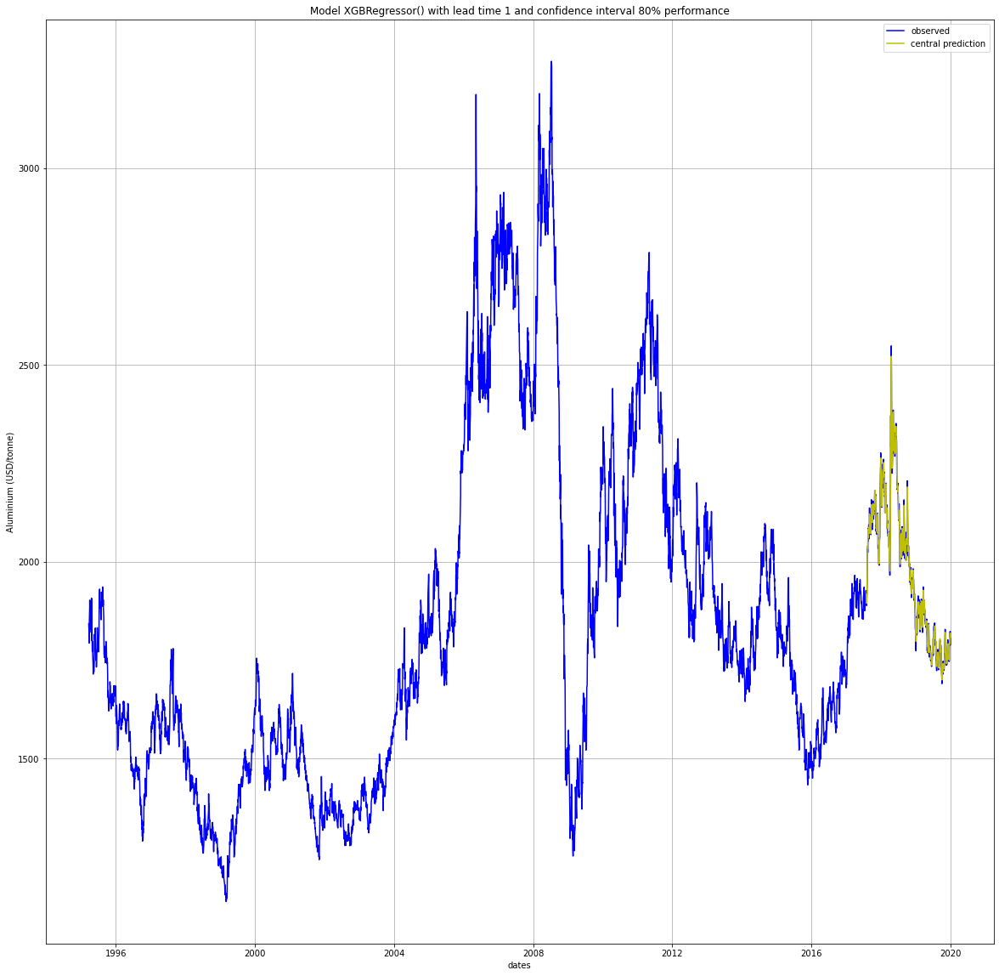

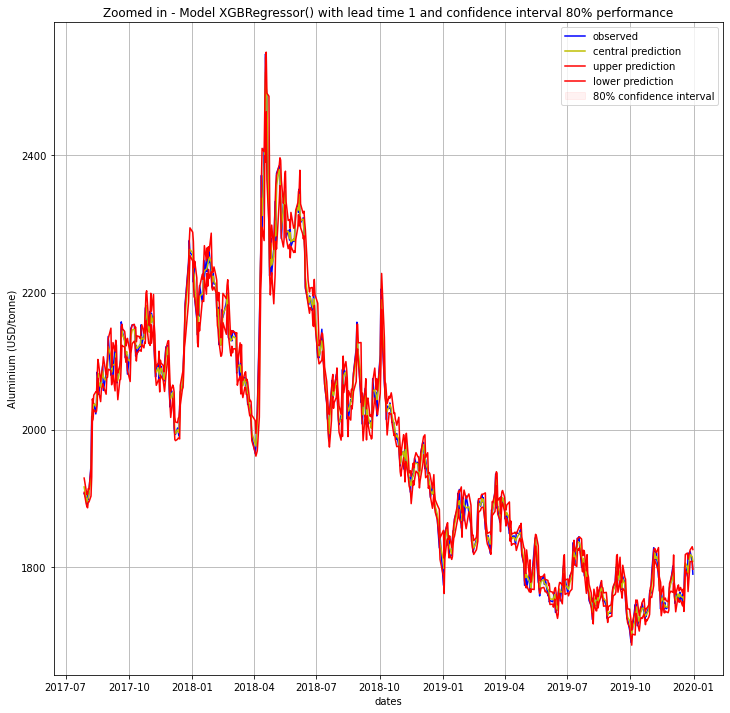

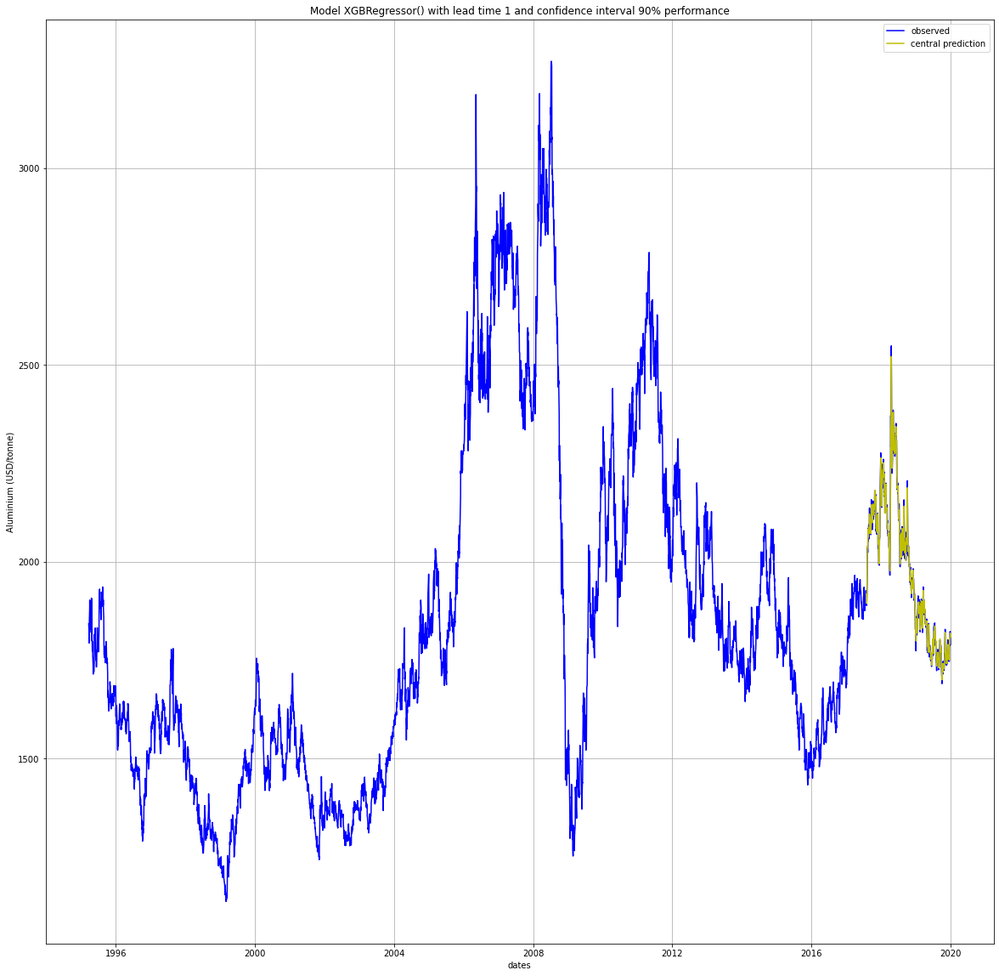

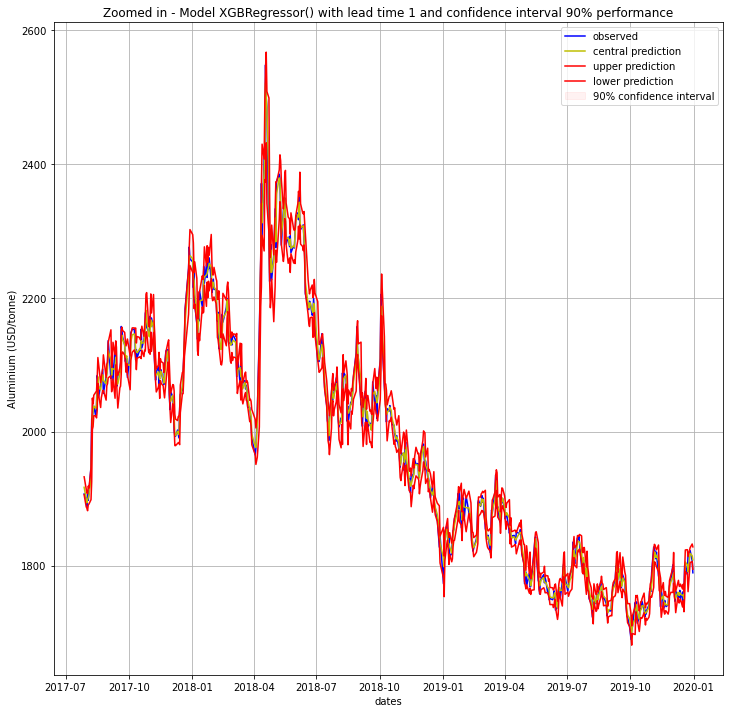

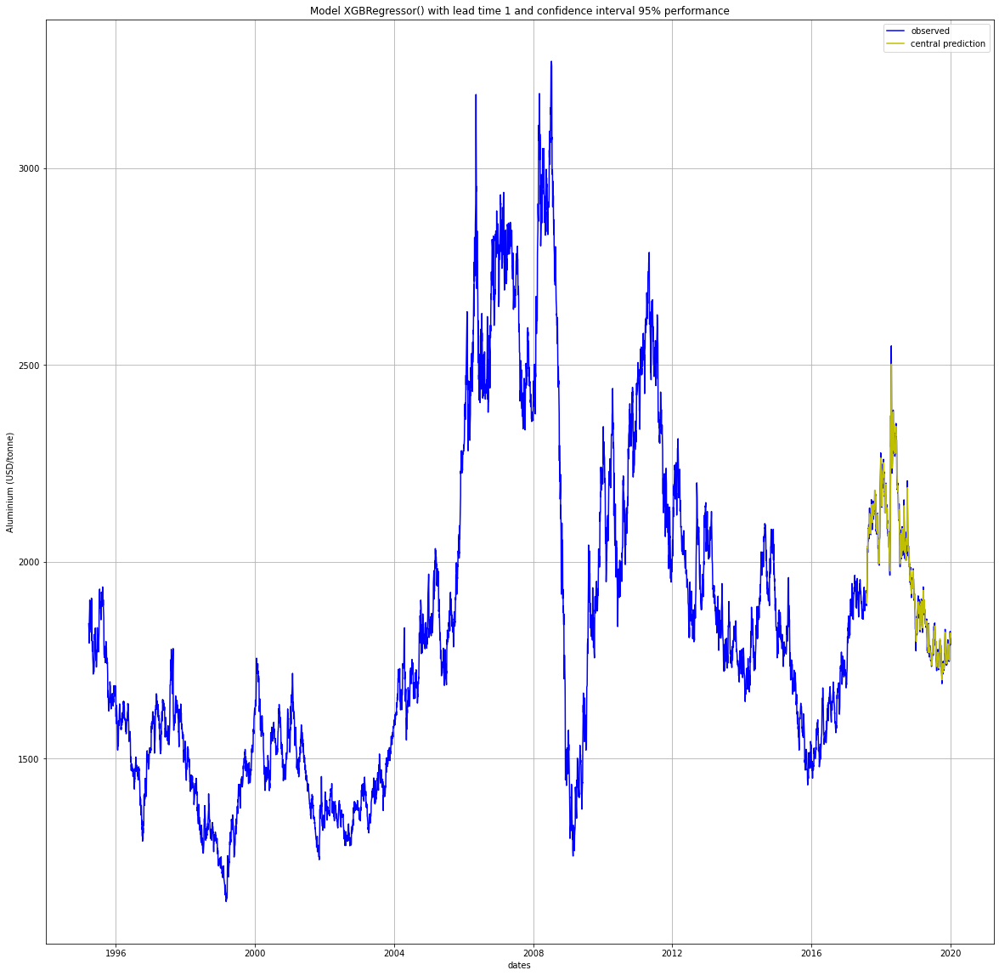

...

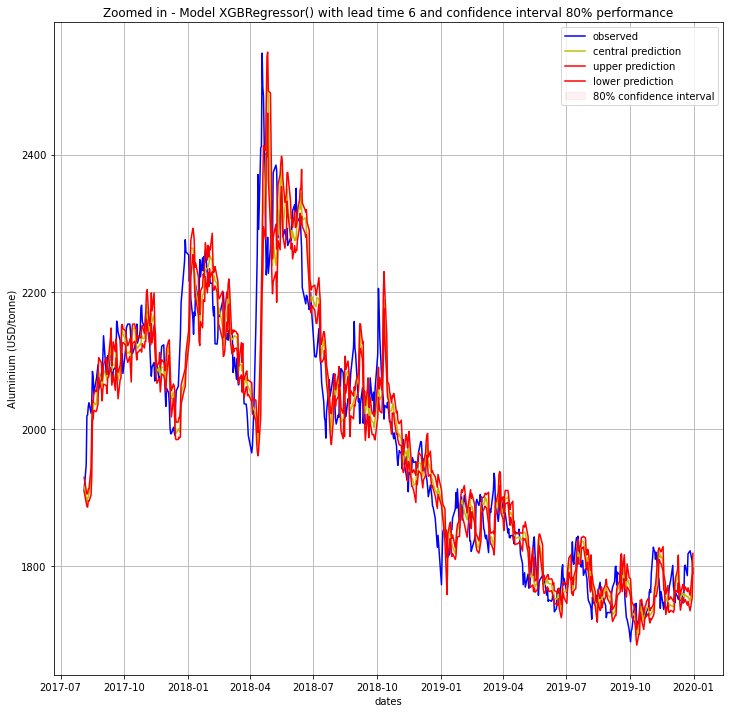

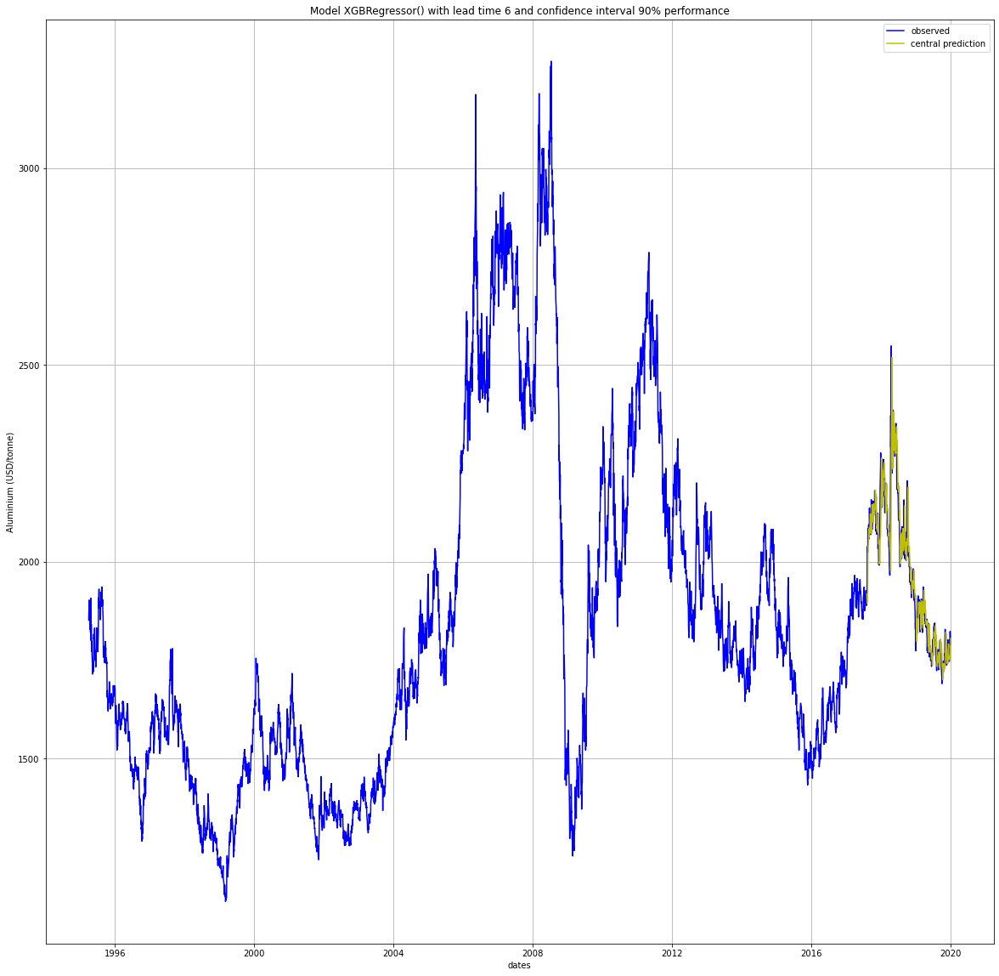

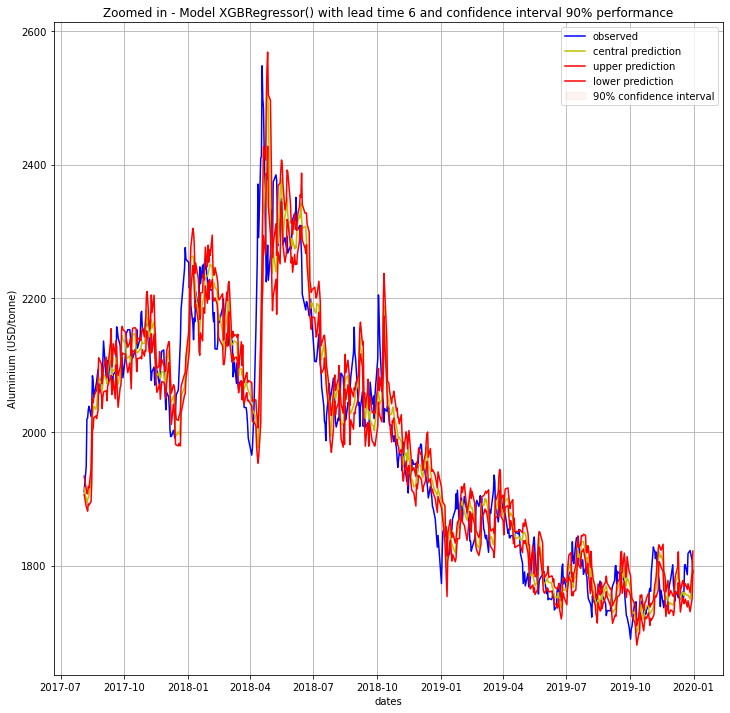

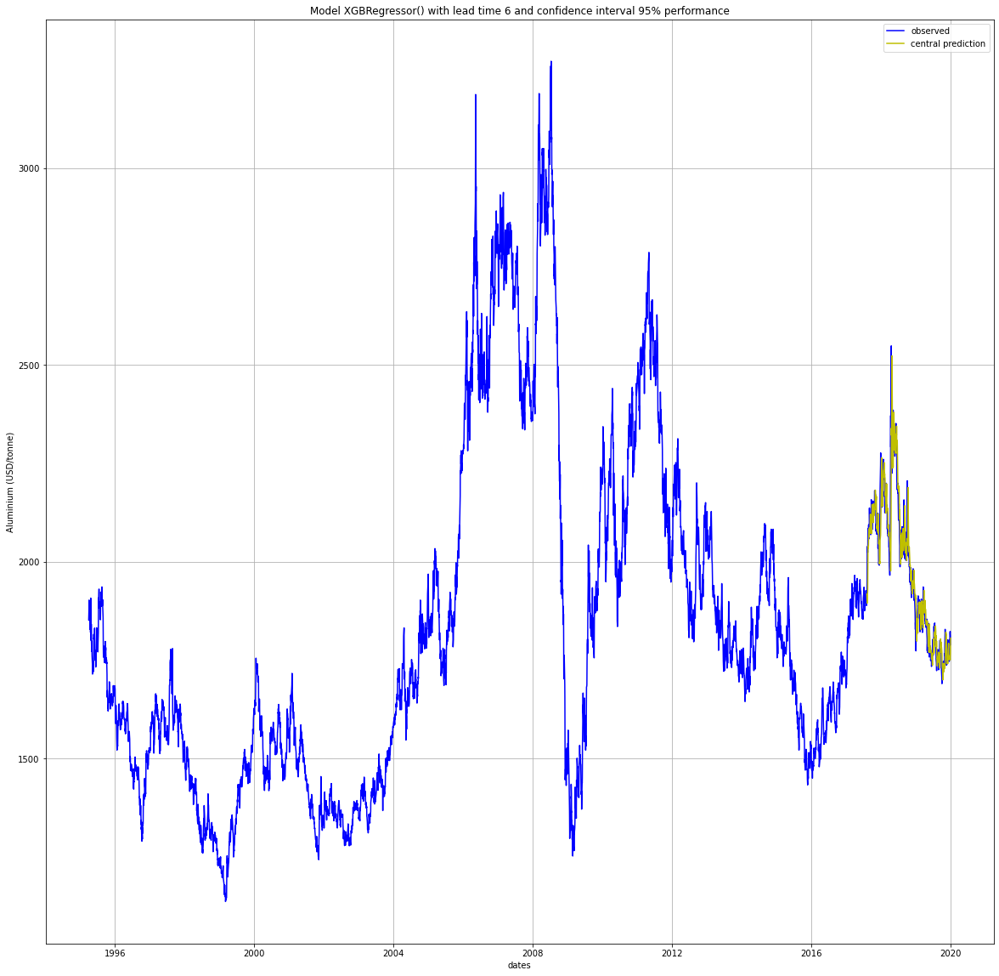

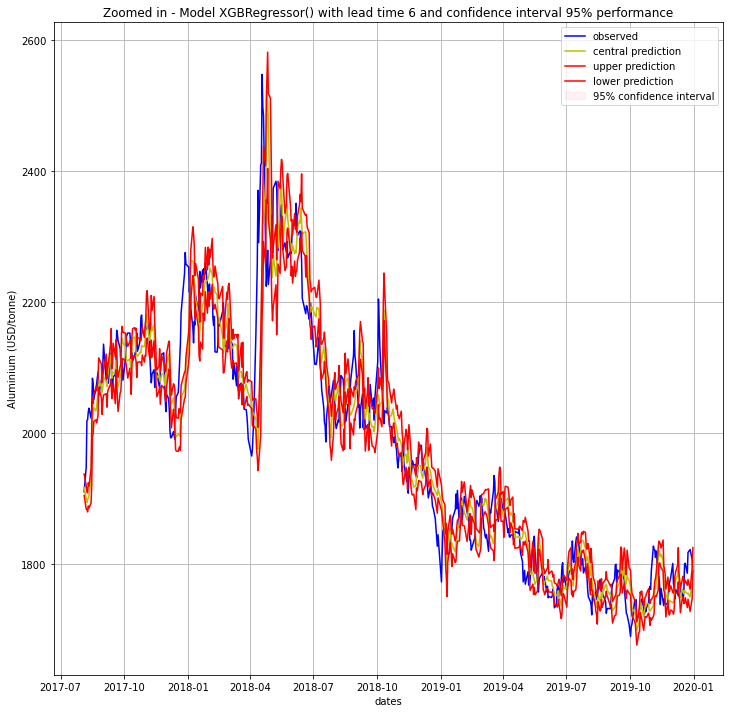

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

In [ ]:
predictions_df = pd.DataFrame()

for model_type in model_types:
    for lead_time in lead_times:
        for confidence_interval in confidence_intervals:

            results, predictions, y_test = model_run(lagged_df=lagged_df, 
                                                     model_type=model_type, 
                                                     best_vars=best_vars, 
                                                     lead_time=lead_time, 
                                                     target_var=target_var,
                                                     confidence=confidence_interval,
                                                     boot=1000, 
                                                     test_ratio=0.1
                                                    )
            # plot results
#             print(results)
            plot_model_performance(lagged_df, results, y_test, target_var, results_path)
            zoomed_model_performance(results, y_test, target_var, results_path)
            
            predictions_df = predictions_df.append(results, ignore_index=True)
        
predictions_df.to_excel(excel_results_path+f'ML Model results {target_var}- daily resolution.xlsx', index=False)
predictions_df

### 2. target variable is 'Zinc (USD/tonne)'

ML models

In [ ]:
target_var = 'Zinc (USD/tonne)'

In [46]:
lagged_df = lagged_df_func(df, target_var, min_lag=1, max_lag=50)
lagged_df.dropna(inplace=True)
lagged_df

C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df[variable + '_' + str(i)] = col2
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  lagged_df['Date'] = df['Date']
C:\Users\PANAGI~1.MAV\AppData\Local\Temp/ipykernel_218044/3425211228.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfor

,Aluminium (USD/tonne)_1,Aluminium (USD/tonne)_2,Aluminium (USD/tonne)_3,Aluminium (USD/tonne)_4,Aluminium (USD/tonne)_5,Aluminium (USD/tonne)_6,Aluminium (USD/tonne)_7,Aluminium (USD/tonne)_8,Aluminium (USD/tonne)_9,Aluminium (USD/tonne)_10,Aluminium (USD/tonne)_11,Aluminium (USD/tonne)_12,Aluminium (USD/tonne)_13,Aluminium (USD/tonne)_14,Aluminium (USD/tonne)_15,Aluminium (USD/tonne)_16,Aluminium (USD/tonne)_17,Aluminium (USD/tonne)_18,Aluminium (USD/tonne)_19,Aluminium (USD/tonne)_20,Aluminium (USD/tonne)_21,Aluminium (USD/tonne)_22,Aluminium (USD/tonne)_23,Aluminium (USD/tonne)_24,Aluminium (USD/tonne)_25,Aluminium (USD/tonne)_26,Aluminium (USD/tonne)_27,Aluminium (USD/tonne)_28,Aluminium (USD/tonne)_29,Aluminium (USD/tonne)_30,Aluminium (USD/tonne)_31,Aluminium (USD/tonne)_32,Aluminium (USD/tonne)_33,Aluminium (USD/tonne)_34,Aluminium (USD/tonne)_35,Aluminium (USD/tonne)_36,Aluminium (USD/tonne)_37,Aluminium (USD/tonne)_38,Aluminium (USD/tonne)_39,Aluminium (USD/tonne)_40,Aluminium (USD/tonne)_41,Aluminium (USD/tonne)_42,Aluminium (USD/tonne)_43,Aluminium (USD/tonne)_44,Aluminium (USD/tonne)_45,Aluminium (USD/tonne)_46,Aluminium (USD/tonne)_47,Aluminium (USD/tonne)_48,Aluminium (USD/tonne)_49,Aluminium (USD/tonne)_50,Copper (USD/pound)_1,Copper (USD/pound)_2,Copper (USD/pound)_3,Copper (USD/pound)_4,Copper (USD/pound)_5,Copper (USD/pound)_6,Copper (USD/pound)_7,Copper (USD/pound)_8,Copper (USD/pound)_9,Copper (USD/pound)_10,Copper (USD/pound)_11,Copper (USD/pound)_12,Copper (USD/pound)_13,Copper (USD/pound)_14,Copper (USD/pound)_15,Copper (USD/pound)_16,Copper (USD/pound)_17,Copper (USD/pound)_18,Copper (USD/pound)_19,Copper (USD/pound)_20,Copper (USD/pound)_21,Copper (USD/pound)_22,Copper (USD/pound)_23,Copper (USD/pound)_24,Copper (USD/pound)_25,Copper (USD/pound)_26,Copper (USD/pound)_27,Copper (USD/pound)_28,Copper (USD/pound)_29,Copper (USD/pound)_30,Copper (USD/pound)_31,Copper (USD/pound)_32,Copper (USD/pound)_33,Copper (USD/pound)_34,Copper (USD/pound)_35,Copper (USD/pound)_36,Copper (USD/pound)_37,Copper (USD/pound)_38,Copper (USD/pound)_39,Copper (USD/pound)_40,Copper (USD/pound)_41,Copper (USD/pound)_42,Copper (USD/pound)_43,Copper (USD/pound)_44,Copper (USD/pound)_45,Copper (USD/pound)_46,Copper (USD/pound)_47,Copper (USD/pound)_48,Copper (USD/pound)_49,Copper (USD/pound)_50,Zinc (USD/tonne)_1,Zinc (USD/tonne)_2,Zinc (USD/tonne)_3,Zinc (USD/tonne)_4,Zinc (USD/tonne)_5,Zinc (USD/tonne)_6,Zinc (USD/tonne)_7,Zinc (USD/tonne)_8,Zinc (USD/tonne)_9,Zinc (USD/tonne)_10,Zinc (USD/tonne)_11,Zinc (USD/tonne)_12,Zinc (USD/tonne)_13,Zinc (USD/tonne)_14,Zinc (USD/tonne)_15,Zinc (USD/tonne)_16,Zinc (USD/tonne)_17,Zinc (USD/tonne)_18,Zinc (USD/tonne)_19,Zinc (USD/tonne)_20,Zinc (USD/tonne)_21,Zinc (USD/tonne)_22,Zinc (USD/tonne)_23,Zinc (USD/tonne)_24,Zinc (USD/tonne)_25,Zinc (USD/tonne)_26,Zinc (USD/tonne)_27,Zinc (USD/tonne)_28,Zinc (USD/tonne)_29,Zinc (USD/tonne)_30,Zinc (USD/tonne)_31,Zinc (USD/tonne)_32,Zinc (USD/tonne)_33,Zinc (USD/tonne)_34,Zinc (USD/tonne)_35,Zinc (USD/tonne)_36,Zinc (USD/tonne)_37,Zinc (USD/tonne)_38,Zinc (USD/tonne)_39,Zinc (USD/tonne)_40,Zinc (USD/tonne)_41,Zinc (USD/tonne)_42,Zinc (USD/tonne)_43,Zinc (USD/tonne)_44,Zinc (USD/tonne)_45,Zinc (USD/tonne)_46,Zinc (USD/tonne)_47,Zinc (USD/tonne)_48,Zinc (USD/tonne)_49,Zinc (USD/tonne)_50,Nickel (USD/MT)_1,Nickel (USD/MT)_2,Nickel (USD/MT)_3,Nickel (USD/MT)_4,Nickel (USD/MT)_5,Nickel (USD/MT)_6,Nickel (USD/MT)_7,Nickel (USD/MT)_8,Nickel (USD/MT)_9,Nickel (USD/MT)_10,Nickel (USD/MT)_11,Nickel (USD/MT)_12,Nickel (USD/MT)_13,Nickel (USD/MT)_14,Nickel (USD/MT)_15,...,DJIA (USD)_38,DJIA (USD)_39,DJIA (USD)_40,DJIA (USD)_41,DJIA (USD)_42,DJIA (USD)_43,DJIA (USD)_44,DJIA (USD)_45,DJIA (USD)_46,DJIA (USD)_47,DJIA (USD)_48,DJIA (USD)_49,DJIA (USD)_50,FTSE 100 (GBP)_1,FTSE 100 (GBP)_2,FTSE 100 (GBP)_3,FTSE 100 (GBP)_4,FTSE 100 (GBP)_5,FTSE 100 (GBP)_6,FTSE 100 (GBP)_7,FTSE 100 (GBP)_8,FTSE 100 (GBP)_9,FTSE 100 (GBP)_10,FTSE 100 (GBP)_11,FTSE 100 (GBP)_12,FTSE 10

In [47]:
results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results\performance plots//'
excel_results_path = r'C:\Users\Panagiotis.Mavritsak\Desktop\Malaria\results//'

model_types = ['XGBRegressor()', 'RandomForestRegressor()', 'LinearRegression()', 
               'Ridge()', 'SVR()', 'KNeighborsRegressor()', 'MLPRegressor()']

lead_times = [1, 2, 3, 4, 5, 6]

confidence_intervals = [0.8, 0.9, 0.95]
# confidence_intervals = [0.95]

best_vars = [ x for x in lagged_df.columns if target_var in x ]  # keep best vars univariate
best_vars

['Aluminium (USD/tonne)_1',
 'Aluminium (USD/tonne)_2',
 'Aluminium (USD/tonne)_3',
 'Aluminium (USD/tonne)_4',
 'Aluminium (USD/tonne)_5',
 'Aluminium (USD/tonne)_6',
 'Aluminium (USD/tonne)_7',
 'Aluminium (USD/tonne)_8',
 'Aluminium (USD/tonne)_9',
 'Aluminium (USD/tonne)_10',
 'Aluminium (USD/tonne)_11',
 'Aluminium (USD/tonne)_12',
 'Aluminium (USD/tonne)_13',
 'Aluminium (USD/tonne)_14',
 'Aluminium (USD/tonne)_15',
 'Aluminium (USD/tonne)_16',
 'Aluminium (USD/tonne)_17',
 'Aluminium (USD/tonne)_18',
 'Aluminium (USD/tonne)_19',
 'Aluminium (USD/tonne)_20',
 'Aluminium (USD/tonne)_21',
 'Aluminium (USD/tonne)_22',
 'Aluminium (USD/tonne)_23',
 'Aluminium (USD/tonne)_24',
 'Aluminium (USD/tonne)_25',
 'Aluminium (USD/tonne)_26',
 'Aluminium (USD/tonne)_27',
 'Aluminium (USD/tonne)_28',
 'Aluminium (USD/tonne)_29',
 'Aluminium (USD/tonne)_30',
 'Aluminium (USD/tonne)_31',
 'Aluminium (USD/tonne)_32',
 'Aluminium (USD/tonne)_33',
 'Aluminium (USD/tonne)_34',
 'Aluminium (USD/tonne)

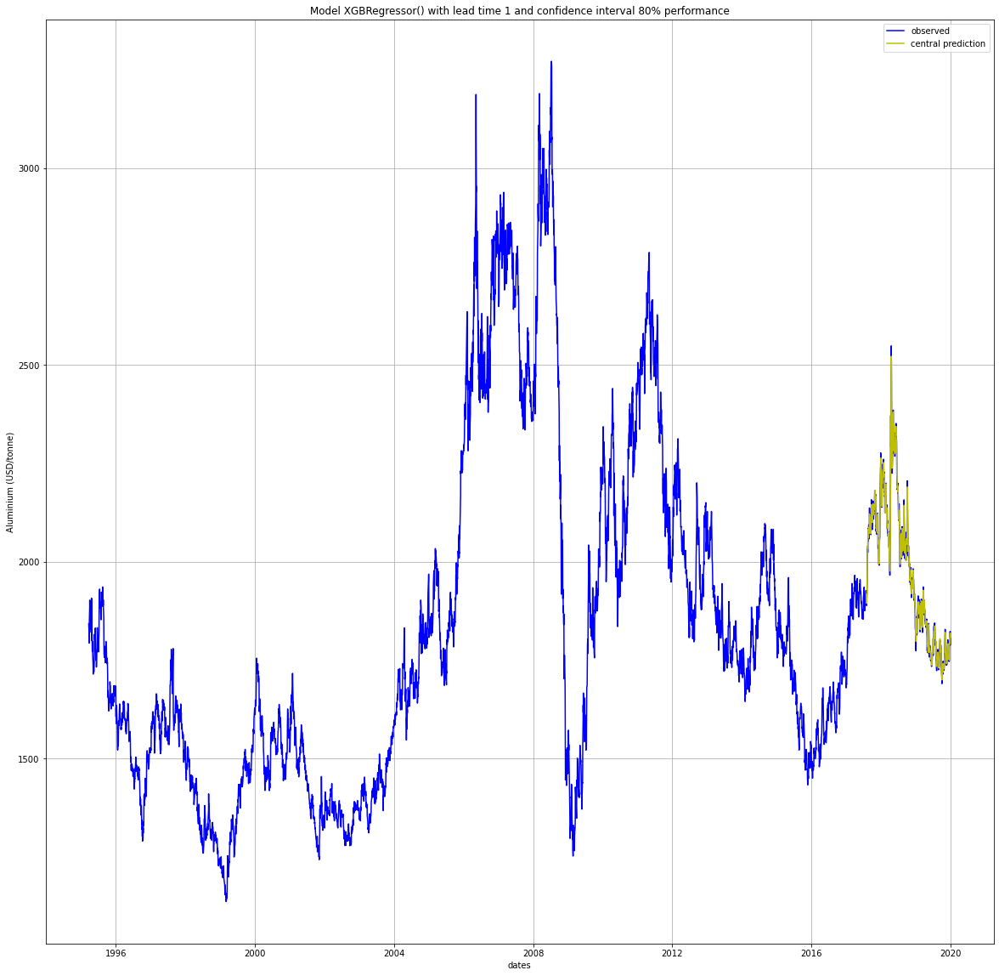

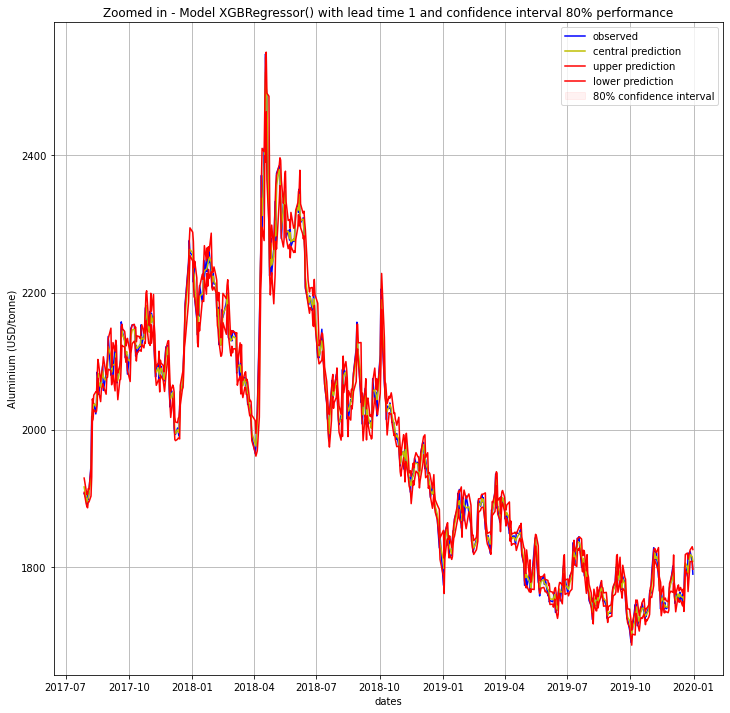

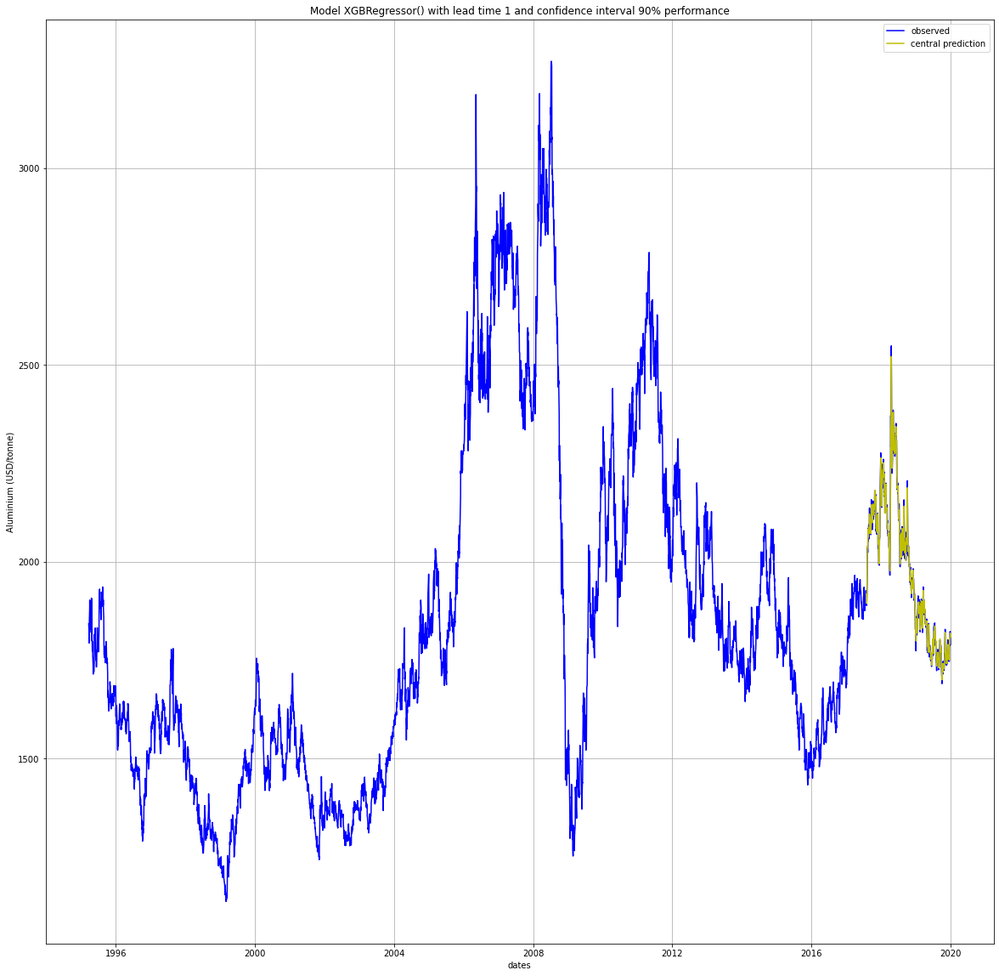

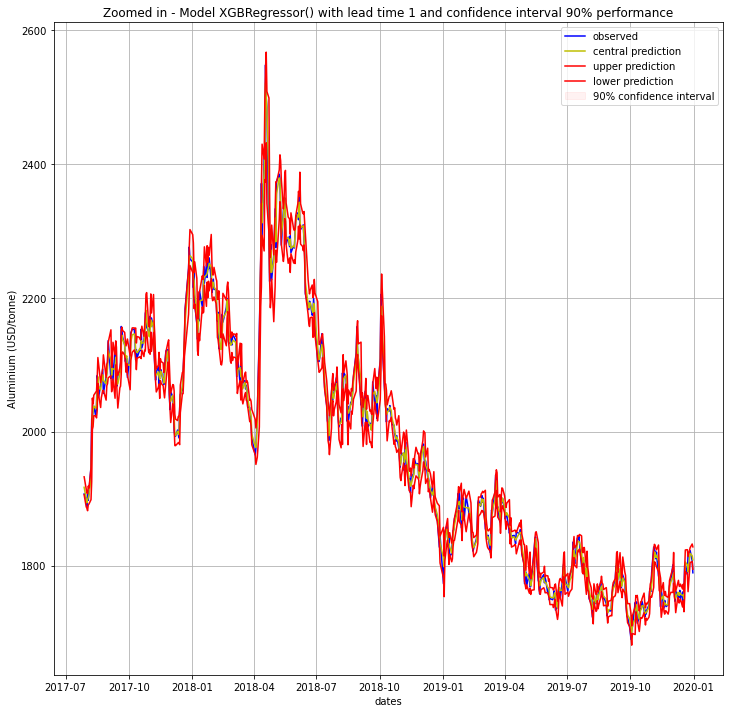

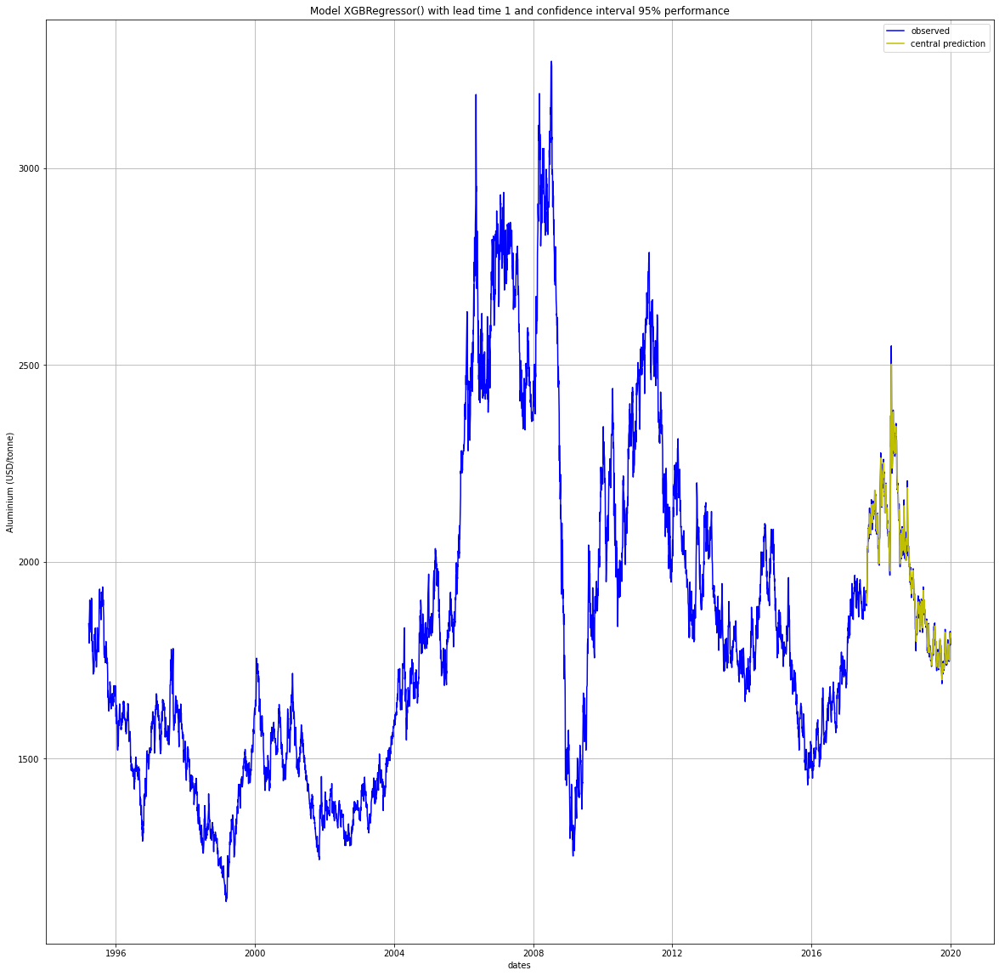

...

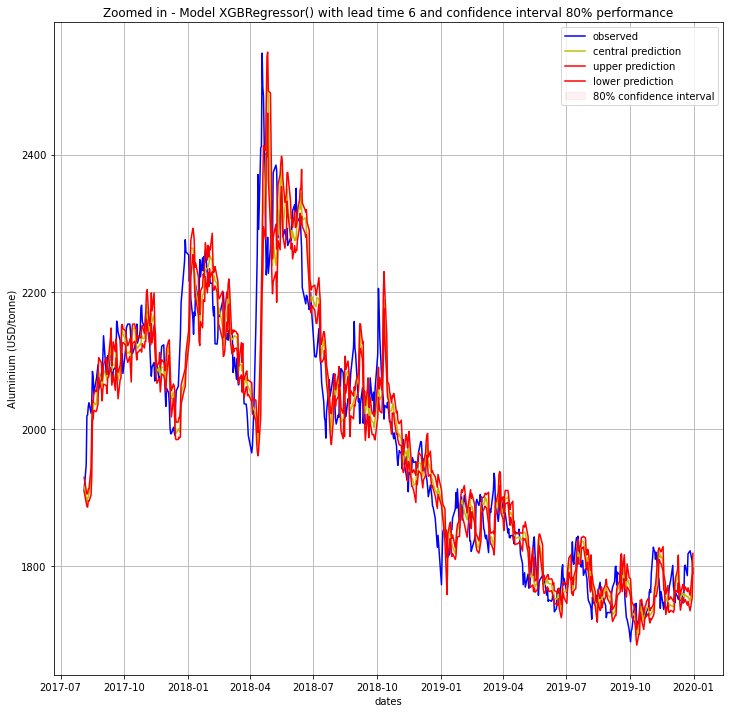

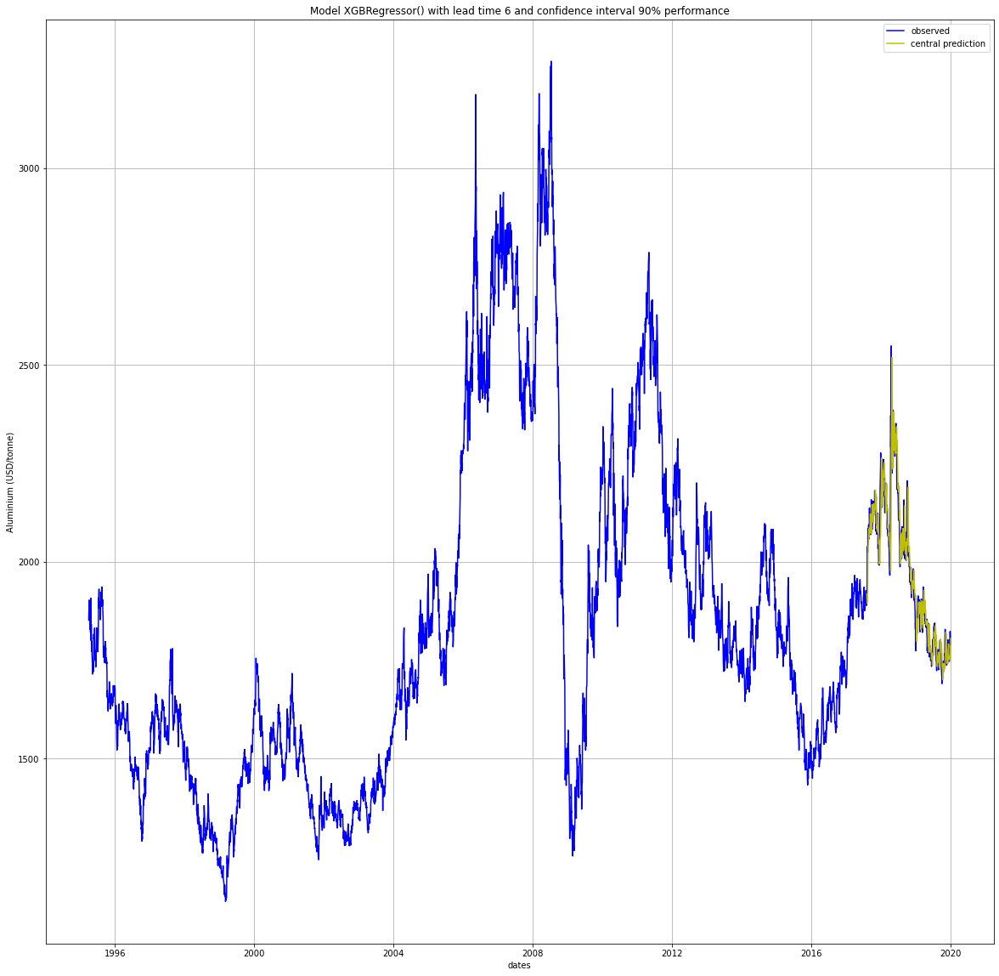

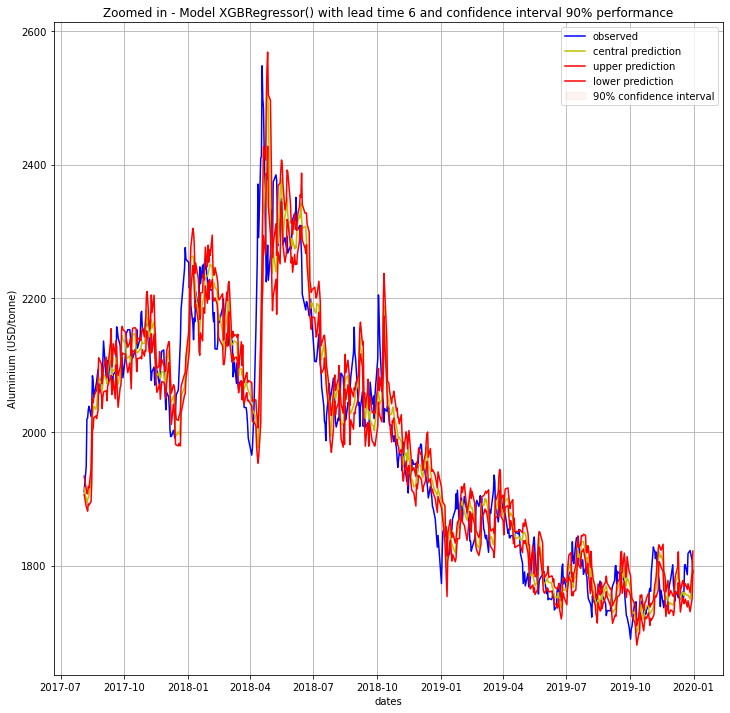

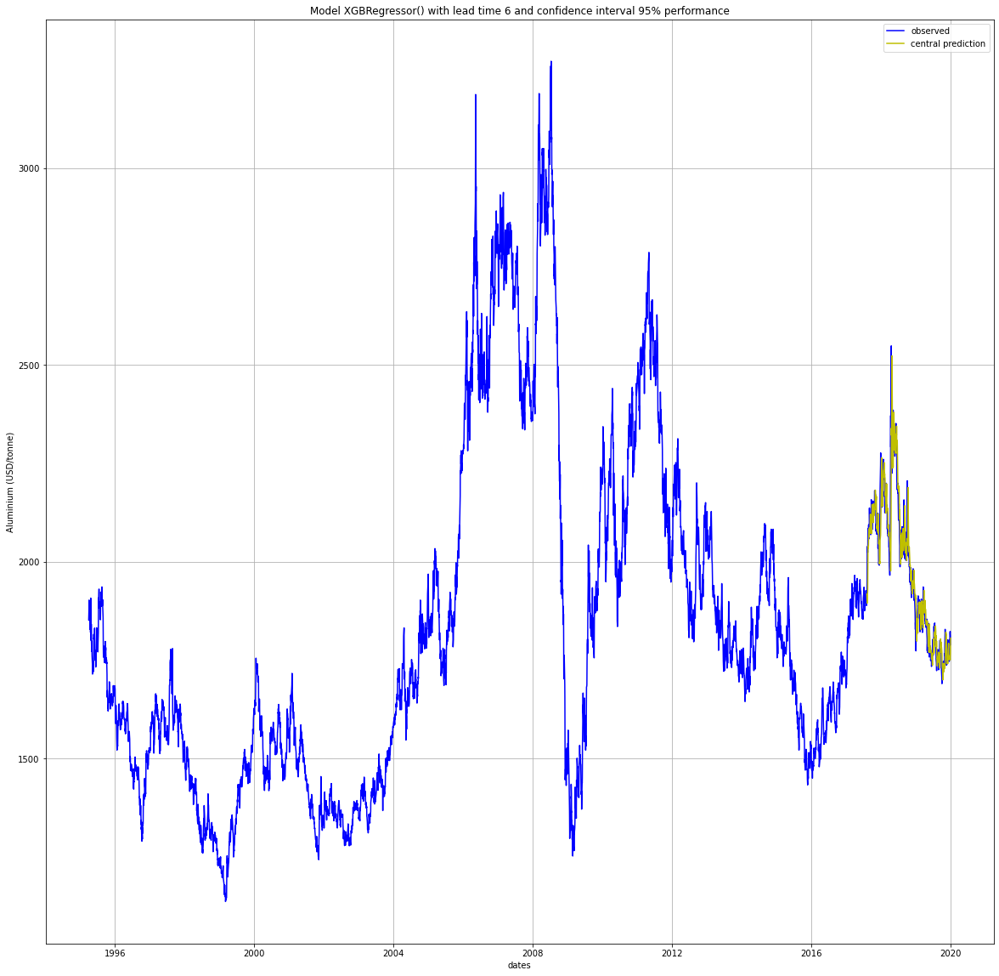

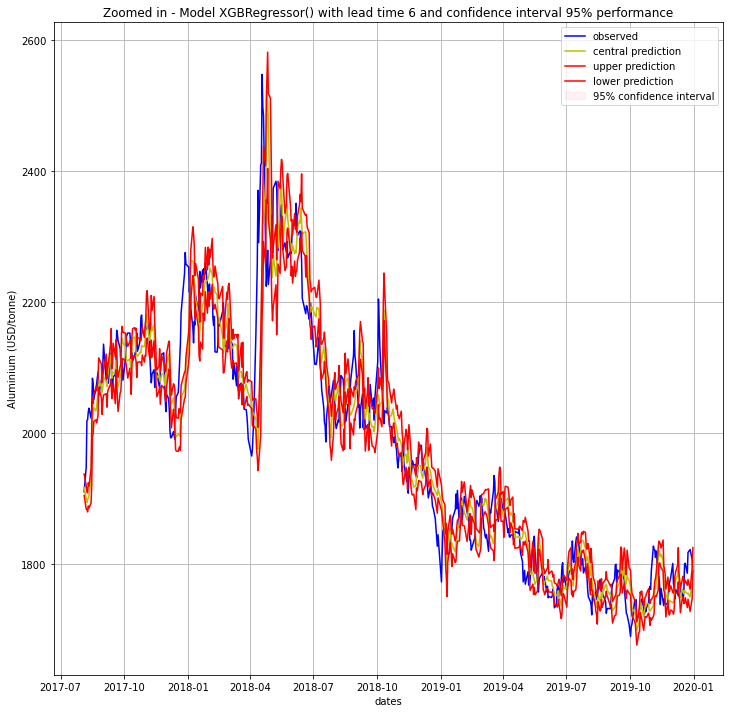

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\ProgramData\Anaconda3\envs\new_malaria_prediction\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names

In [ ]:
predictions_df = pd.DataFrame()

for model_type in model_types:
    for lead_time in lead_times:
        for confidence_interval in confidence_intervals:

            results, predictions, y_test = model_run(lagged_df=lagged_df, 
                                                     model_type=model_type, 
                                                     best_vars=best_vars, 
                                                     lead_time=lead_time, 
                                                     target_var=target_var,
                                                     confidence=confidence_interval,
                                                     boot=1000, 
                                                     test_ratio=0.1
                                                    )
            # plot results
#             print(results)
            plot_model_performance(lagged_df, results, y_test, target_var, results_path)
            zoomed_model_performance(results, y_test, target_var, results_path)
            
            predictions_df = predictions_df.append(results, ignore_index=True)
        
predictions_df.to_excel(excel_results_path+f'ML Model results {target_var}- daily resolution.xlsx', index=False)
predictions_df

# 2. Multi-variate modeling

In [59]:
def corr_target(df, target_variable, title, results_path):
    '''correlation of individual features with malaria_prev
    Return: sorted dataframe with all the correlations with malaria_prev
    '''

    corrmat = df.corr()
    corrmat = corrmat[target_variable]
    corrmat = corrmat.iloc[:-1]
    corrmat = corrmat.sort_values(ascending=False, key=abs)
    corrmat = pd.DataFrame(data=corrmat, columns=[target_variable])
    corrmat.reset_index(inplace=True)
    corrmat.rename({'index': 'feature'}, axis=1, inplace=True)

    corrmat.to_excel(results_path + title, index=False)

    return (corrmat)

def choose_best_vars(lagged_df, lead_times, target_variable, results_path, thr = 0.4):
    best_vars = []

    for lead_time in lead_times:
        title = f'Sorted correlations for lead time {lead_time}.xlsx'
        if lead_time==1:
            df_corr = corr_target(lagged_df, target_variable, title, results_path)
        else:
            temp_lagged_df = copy.deepcopy(lagged_df)
            temp_lagged_df[target_variable] = lagged_df[target_variable].shift(-lead_time+1)
            temp_lagged_df.dropna(inplace=True)
            df_corr = corr_target(temp_lagged_df, target_variable, title, results_path)

        df_corr = df_corr[ df_corr[target_variable] > thr ]
        bv = df_corr.feature.to_list()

        best_vars.append(bv)
    return best_vars

### 1. XGBoost

In [ ]:
lagged_df = lagged_df_func(df, target_variable, min_lag=1, max_lag=4)
lagged_df.dropna(inplace=True)
lagged_df